# Nonlinear precipitation dimensionality reduction

The majority of the code below is related to post-processing/visualization as we attempt to unravel what different clusters of points mean physically.

If you have any questions, please reach out to Fraser King (kingfr@umich.edu)

In [1]:
##### Imports
import umap
import umap.plot
import numpy as np
import xarray as xr
import pandas as pd
import netCDF4 as nc
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from matplotlib.colors import LogNorm
from sklearn.manifold import Isomap
from sklearn.cluster import HDBSCAN
from scipy.interpolate import Rbf
from sklearn.manifold import TSNE
from datetime import timedelta
%matplotlib inline

##### Setup matplotlib figure settings
plt.rcParams.update({'font.size': 15})
plt.rcParams["figure.figsize"] = [16,16]

/Users/fraserking/miniforge3/envs/pca/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/fraserking/miniforge3/envs/pca/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/fraserking/miniforge3/envs/pca/lib/python3.11/site-packag

In [2]:
##### Global variables
RHO_CUTOFF = 0.4
FRAC = 1
SEED = 42
sigma = 2

path = '/Users/fraserking/Development/pca/data/pca_inputs/all_sites_pip_met.csv'
palette = ['red', '#0f9adb', 'blue', '#8d2c8d', '#e8b400', '#007e58', 'gray', 'black']
features = ['n0_log', 'lambda_log', 'Fs', 'Rho_log', 'Sr_log', 'Rr_log', 'Nt_log', 't', 'rh', 'dp', 'p', 'ws', 'wd']

# A few color palettes :: TODO this should be consolidated!
color_palette = {
    0: 'black',
    1: '#3cb44b',
    2: '#4363d8',
    3: '#bfef45',
    4: '#42d4f4',
    5: '#911eb4',
    6: '#ffe119',
    7: '#e6194B',
    8: '#f032e6',
    9: '#f58231',
    10: 'gray',
    11: 'black',
    12: 'black',
    13: 'black'
}

color_palette2 = {
    1: '#3cb44b',
    2: '#4363d8',
    3: '#bfef45',
    4: '#42d4f4',
    5: '#911eb4',
    6: '#ffe119',
    7: '#e6194B',
    8: '#f032e6',
    9: '#f58231',
    10: 'gray',
    11: 'black',
    12: 'black',
    13: 'black'
}

colors = ['black',
            '#3cb44b', '#4363d8','#bfef45','#42d4f4','#911eb4',
            '#ffe119','#e6194B', '#f032e6','#f58231','gray',
            'black','black','black']

In [3]:
##### Read in precomputed input variables

df = pd.read_csv(path)
##### Clean up outlier/erroneous MET obs
df = df[df['t'] >= -50]
df = df[df['p'] <= 5000]
df = df[df['wd'] >= 0]
df = df[df['ws'] <= 25]
df['n0_log'] = np.log10(df['n0']) 
df = df[df['n0_log'] >= 0]
df['lambda_log'] = np.log10(df['lambda'])
df = df[df['lambda_log'] <= 0.5]
df['Nt_log'] = np.log10(df['Nt'])
df['Rho_log'] = np.log10(df['Rho'])
df['Sr_log'] = np.log10(df['Sr'])
df['Rr_log'] = np.log10(df['Rr'])
df['Sr_log'] = df['Sr_log'].replace(-np.inf, 0)
df['Rr_log'] = df['Rr_log'].replace(-np.inf, 0)
df['Dm'] = df['D0']
df['Dm_log'] = np.log10(df['Dm'])
df['phase'] = np.where(df['Rho'] > RHO_CUTOFF, 'rain', 'snow')
df.drop(['D0'], axis=1, inplace=True)
df['time'] = pd.to_datetime(df['time'])

##### Remove bad IMP dates and ICP:
start_date = pd.to_datetime('2022-01-29 00:00:00')
end_date = pd.to_datetime('2022-01-30 23:59:59')
df = df[~((df['site'] == 'IMP') & (df['time'] >= start_date) & (df['time'] <= end_date))]
df = df[df.site != 'ICP']

##### Select subset based on FRAC value
df = df.drop_duplicates(keep='first', subset=['site', 'time'])
df_all = df.sample(frac=FRAC, random_state=SEED)
# df_all.to_csv('../data/nonlinear/data_subset.csv')

##### Normalize the features
for feature in features:
    mean_value = df_all[feature].mean()
    std_value = df_all[feature].std()
    df_all[f"{feature}_norm"] = (df_all[feature] - mean_value) / std_value

scaled_data = df_all.loc[:, ['n0_log_norm', 'lambda_log_norm', 'Fs_norm', 'Rho_log_norm', 'Sr_log_norm', 'Rr_log_norm', 'Nt_log_norm',
                             't_norm', 'rh_norm', 'dp_norm', 'p_norm', 'ws_norm']].values

##### Quick data check
print(scaled_data.shape)
print(df_all.shape)

/Users/fraserking/miniforge3/envs/pca/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/fraserking/miniforge3/envs/pca/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


(182233, 12)
(182233, 39)


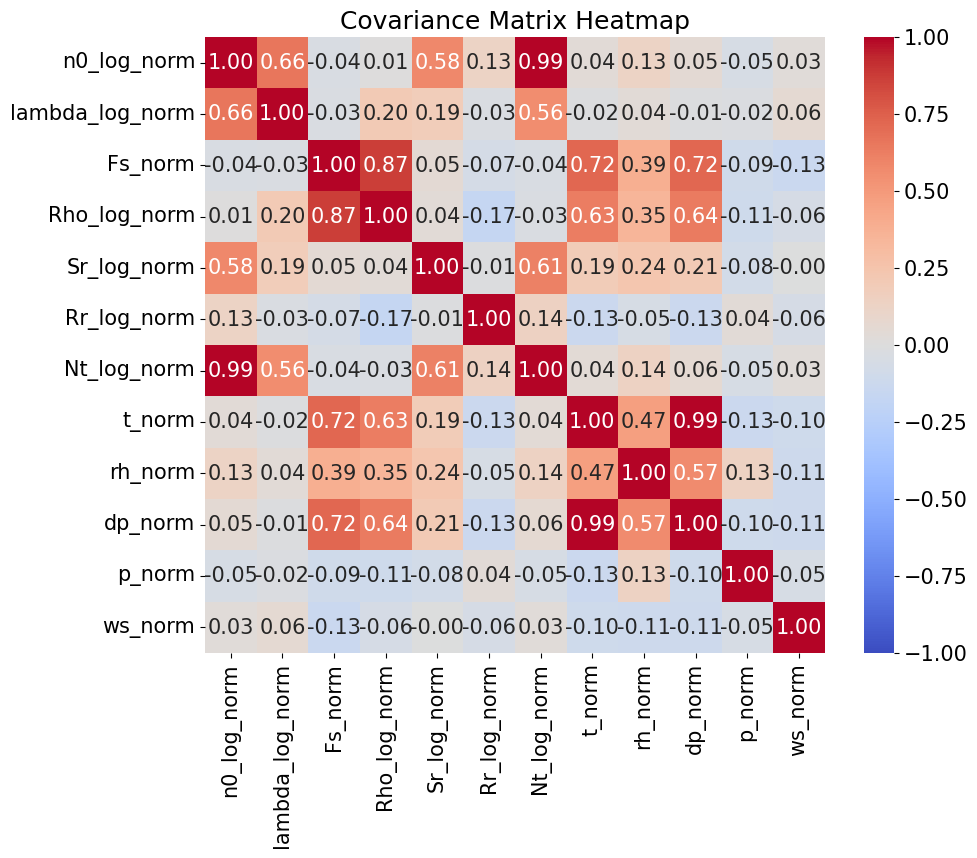

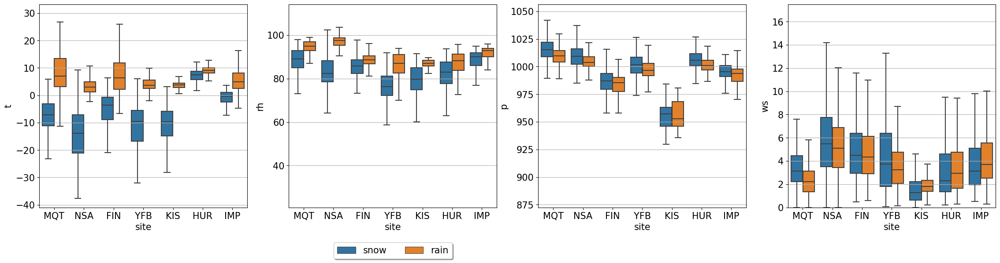

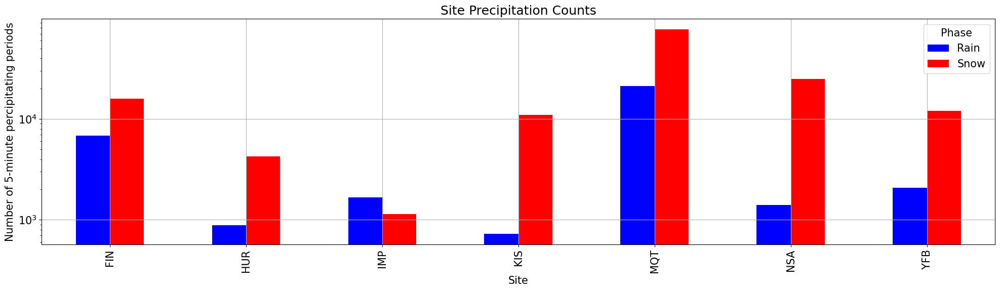

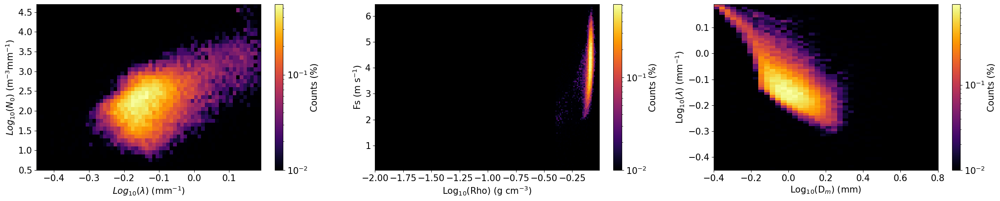

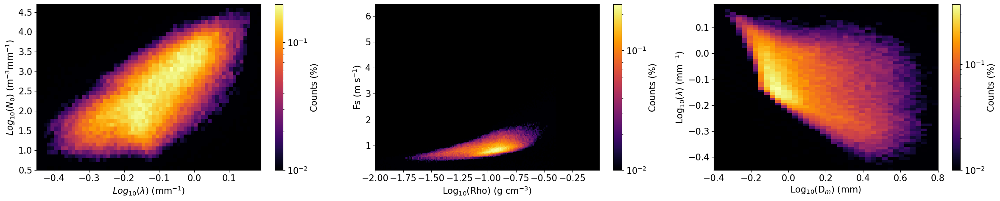

In [4]:
##### Below are a series of visualizing functions (mostly sanity checks on the input variables)
def plot_conv_matrix():
    cov_matrix = df_all.loc[:, ['n0_log_norm', 'lambda_log_norm', 'Fs_norm', 'Rho_log_norm', 'Sr_log_norm', 'Rr_log_norm', 'Nt_log_norm',
                               't_norm', 'rh_norm', 'dp_norm', 'p_norm', 'ws_norm']].cov()
    plt.figure(figsize=(10, 8))
    sns.heatmap(cov_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1,
                xticklabels=cov_matrix.columns, yticklabels=cov_matrix.columns)
    plt.title('Covariance Matrix Heatmap')
    plt.show()



def plot_met():
    fig, axes = plt.subplots(1, 4, figsize=(28, 6))
    axes[0].grid()
    axes[1].grid()
    axes[2].grid()
    axes[3].grid()
    sns.boxplot(data=df_all, x="site", y="t", hue='phase', fliersize=0,  ax=axes[0])
    sns.boxplot(data=df_all, x="site", y="rh", hue='phase', fliersize=0, ax=axes[1])
    sns.boxplot(data=df_all, x="site", y="p", hue='phase',  fliersize=0, ax=axes[2])
    sns.boxplot(data=df_all, x="site", y="ws", hue='phase',  fliersize=0, ax=axes[3])
    axes[3].set_ylim((0,17.5))
    axes[0].get_legend().remove()
    axes[2].get_legend().remove()
    axes[3].get_legend().remove()
    axes[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
            fancybox=True, shadow=True, ncol=5)
    plt.show()



def plot_site_counts():
    count_df = df
    grouped_data = count_df.groupby(['site', 'phase']).size()
    series = pd.Series(grouped_data)
    df2 = series.unstack()
    df2 = df2.reset_index()
    df2.columns = ['Site', 'Rain', 'Snow']

    fig, ax = plt.subplots(figsize=(20, 6))
    df2.plot(x='Site', y=['Rain', 'Snow'], kind='bar', ax=ax, color=['blue', 'red'])
    ax.grid()
    ax.set_yscale('log')
    ax.set_title('Site Precipitation Counts')
    ax.set_xlabel('Site')
    ax.set_ylabel('Number of 5-minute percipitating periods')
    plt.legend(title='Phase')
    plt.tight_layout()
    plt.show()



def plot_stats(df, rho_min, rho_max, fs_min, fs_max, fs_step):
    bin_N0 = np.arange(0.5, 4.75, 0.1)
    bin_lambda = np.arange(-0.45, 0.2, 0.01)
    bin_rho = np.arange(rho_min, rho_max, 0.01)
    bin_fs = np.arange(fs_min, fs_max, fs_step)
    bin_dm = np.arange(-0.4, 0.8, 0.03)
    bin_lambda2 = bin_lambda.copy()

    cmap = plt.get_cmap('inferno')
    cmap.set_bad(color='black')

    plt.rcParams.update({'font.size': 15})
    fig, axes = plt.subplots(1, 3, figsize=(24, 5))
    n0_lambda_hist = np.histogram2d(df['lambda_log'], df['n0_log'], (bin_lambda, bin_N0))
    hist = 100 * n0_lambda_hist[0].T / np.sum(n0_lambda_hist[0].T)
    pcm = axes[0].pcolormesh(bin_lambda, bin_N0, hist, cmap=cmap, norm=LogNorm(vmin=0.01, vmax=hist.max()))
    axes[0].set_facecolor('#440154')
    axes[0].set_xlabel("$Log_{10}(λ)$ (mm$^{-1}$)")
    axes[0].set_ylabel("$Log_{10}(N_{0})$ (m$^{-3}$mm$^{-1}$)")
    fig.colorbar(pcm, ax=axes[0], orientation='vertical').set_label("Counts (%)")

    rho_fs_hist = np.histogram2d(df['Rho_log'], df['Fs'], (bin_rho, bin_fs))
    hist = 100 * rho_fs_hist[0].T / np.sum(rho_fs_hist[0].T)
    pcm = axes[1].pcolormesh(bin_rho, bin_fs, hist, cmap=cmap, norm=LogNorm(vmin=0.01, vmax=hist.max()))
    axes[1].set_facecolor('#440154')
    axes[1].set_xlabel("Log$_{10}$(Rho) (g cm$^{-3}$)")
    axes[1].set_ylabel("Fs (m s$^{-1}$)")
    fig.colorbar(pcm, ax=axes[1], orientation='vertical').set_label("Counts (%)")

    dm_sr_hist = np.histogram2d(df['Dm_log'], df['lambda_log'], (bin_dm, bin_lambda2))
    hist = 100 * dm_sr_hist[0].T / np.sum(dm_sr_hist[0].T)
    pcm = axes[2].pcolormesh(bin_dm, bin_lambda2, hist, cmap=cmap, norm=LogNorm(vmin=0.01, vmax=hist.max()))
    axes[2].set_facecolor('#440154')
    axes[2].set_xlabel("Log$_{10}$(D$_m$) (mm)")
    axes[2].set_ylabel("Log$_{10}$($\lambda$) (mm$^{-1}$)")
    fig.colorbar(pcm, ax=axes[2], orientation='vertical').set_label("Counts (%)")

    plt.tight_layout()
    plt.show()


##### Plot some data statistics
plot_conv_matrix()
plot_met()
plot_site_counts()

snowdf = df[df['phase'] == 'snow']
raindf = df[df['phase'] == 'rain']

plot_stats(raindf, -2, 0, 0.05, 6.5, 0.05)
plot_stats(snowdf, -2, 0, 0.05, 6.5, 0.05)


PCA Fit!
(182233, 8)
[0.31061796 0.2371251  0.09874844 0.08458828 0.07959733 0.07400106
 0.04604239 0.03774406]


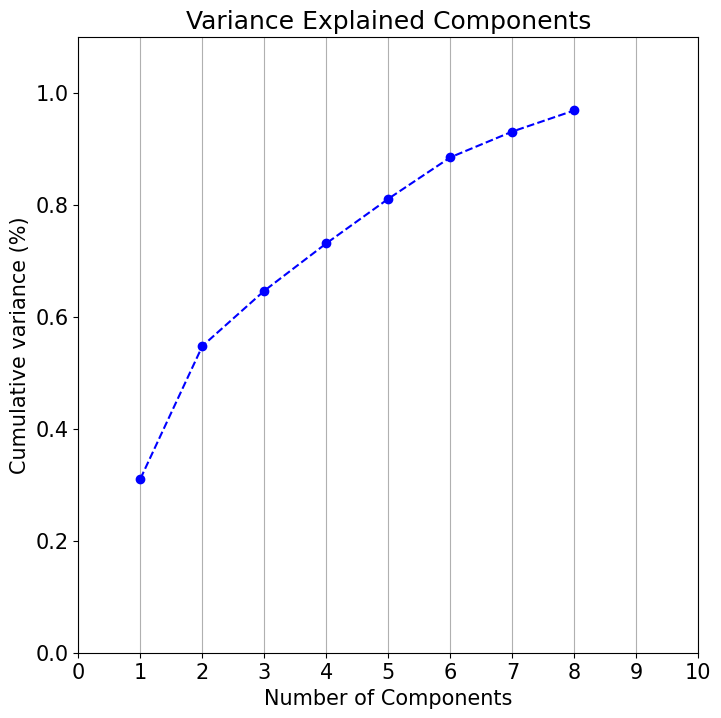

In [5]:
##### Perform PCA

##### run_pca(): Helper function for fitting the PCA to the input data
def run_pca():
    global df_all
    pca = PCA(n_components = 0.95)
    pca.fit(scaled_data)
    pca_embedding = pca.transform(scaled_data)
    print("PCA Fit!")
    print(pca_embedding.shape)
    print(pca.explained_variance_ratio_)

    fig, ax = plt.subplots(figsize=(8,8))
    y = np.cumsum(pca.explained_variance_ratio_)
    xi = np.arange(1, len(y)+1, step=1)
    plt.ylim(0.0,1.1)
    plt.plot(xi, y, marker='o', linestyle='--', color='b')
    plt.xlabel('Number of Components')
    plt.xticks(np.arange(0, 11, step=1))
    plt.ylabel('Cumulative variance (%)')
    plt.title('Variance Explained Components')
    ax.grid(axis='x')
    plt.show()

    cols=[]
    for i in range(pca_embedding.shape[1]):
        cols.append('pca_eof' + str(i+1))
    principalDf = pd.DataFrame(data = pca_embedding, columns = cols)
    df_all = df_all.reset_index(drop=True)
    principalDf = principalDf.reset_index(drop=True)
    df_all = pd.concat([df_all, principalDf], axis=1)

    return pca_embedding, cols, principalDf, pca



pca_embedding, cols, principalDf, pca = run_pca()


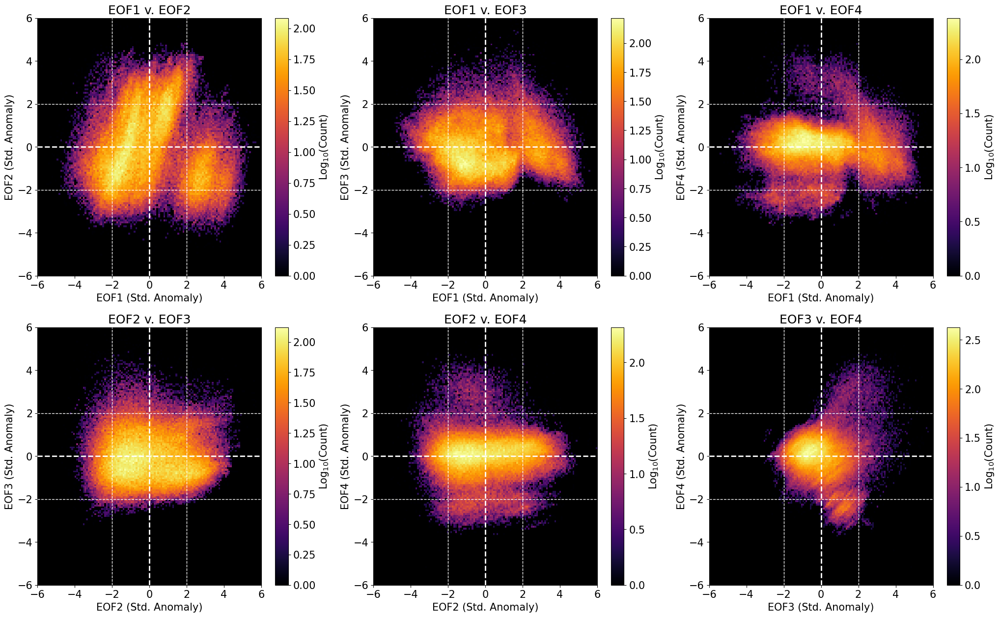

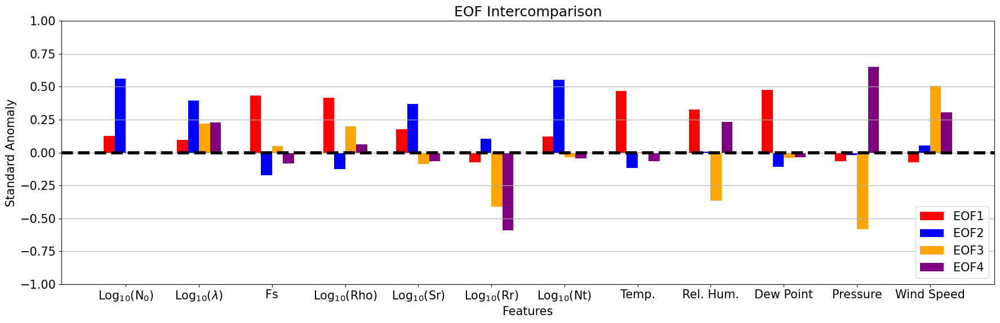

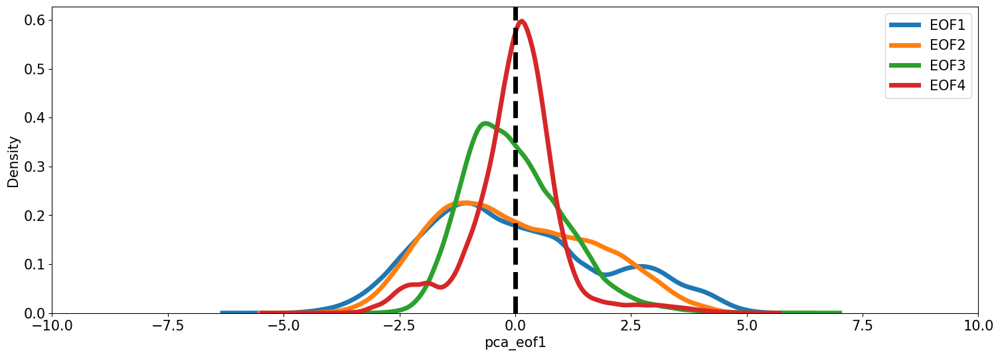

In [6]:
##### plot_pca_eofs: Another visualization function for plotting various diagnostic graphs showing the PCA EOF distributions
def plot_pca_eofs(cols, principalDf, pca):
    loadings = pd.DataFrame(pca.components_.T, columns=cols, index=['Log$_{10}$(N${_0}$)', 'Log$_{10}$($\lambda$)', 'Fs', 'Log$_{10}$(Rho)', 'Log$_{10}$(Sr)', \
                                                                    'Log$_{10}$(Rr)', 'Log$_{10}$(Nt)', 'Temp.', 'Rel. Hum.', 'Dew Point', 'Pressure', 'Wind Speed'])

    ##### Plot 2D joint distributions
    def make_pca_plot(ax, pc_a, pc_b, xlabel, ylabel, title, colmap):
        ax.set_facecolor('white')
        ax.set_facecolor('black')
        extent = 6
        ax.set_title(title)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.axhline(sigma, linewidth=1, color='white', linestyle='--', zorder=1001)
        ax.axvline(-sigma, linewidth=1, color='white', linestyle='--', zorder=1001)
        ax.axhline(-sigma, linewidth=1, color='white', linestyle='--', zorder=1001)
        ax.axvline(sigma, linewidth=1, color='white', linestyle='--', zorder=1001)
        ax.axhline(0, linewidth=2, color='white', linestyle='--', zorder=1001)
        ax.axvline(0, linewidth=2, color='white', linestyle='--', zorder=1001)
        ax.set_xlim((-extent, extent))
        ax.set_ylim((-extent, extent))

        counts, xedges, yedges = np.histogram2d(pc_a, pc_b, bins=125)
        counts = np.where(counts < 1, np.nan, counts)
        counts = np.log10(counts)
        pcm = ax.pcolormesh(xedges, yedges, counts.T, cmap=colmap, rasterized=True, zorder=1000)
        cbar = plt.colorbar(pcm, ax=ax, label='Log$_{10}$(Count)')
        cbar.ax.minorticks_off()

    colmap = 'inferno'
    fig, axes = plt.subplots(2, 3, figsize=(25, 15))
    make_pca_plot(axes[0][0], principalDf['pca_eof1'], principalDf['pca_eof2'], 'EOF1 (Std. Anomaly)', 'EOF2 (Std. Anomaly)', f'EOF1 v. EOF2', colmap)
    make_pca_plot(axes[0][1], principalDf['pca_eof1'], principalDf['pca_eof3'], 'EOF1 (Std. Anomaly)', 'EOF3 (Std. Anomaly)', f'EOF1 v. EOF3', colmap)
    make_pca_plot(axes[0][2], principalDf['pca_eof1'], principalDf['pca_eof4'], 'EOF1 (Std. Anomaly)', 'EOF4 (Std. Anomaly)', f'EOF1 v. EOF4', colmap)
    make_pca_plot(axes[1][0], principalDf['pca_eof2'], principalDf['pca_eof3'], 'EOF2 (Std. Anomaly)', 'EOF3 (Std. Anomaly)', f'EOF2 v. EOF3', colmap)
    make_pca_plot(axes[1][1], principalDf['pca_eof2'], principalDf['pca_eof4'], 'EOF2 (Std. Anomaly)', 'EOF4 (Std. Anomaly)', f'EOF2 v. EOF4', colmap)
    make_pca_plot(axes[1][2], principalDf['pca_eof3'], principalDf['pca_eof4'], 'EOF3 (Std. Anomaly)', 'EOF4 (Std. Anomaly)', f'EOF3 v. EOF4', colmap)
    plt.show()

    ##### Plot EOF standard anoms by variable
    fig, ax = plt.subplots(figsize=(18,6))
    x = np.arange(len(loadings.index))
    bar_width = 0.15

    ax.bar(x - bar_width - bar_width/2, loadings['pca_eof1'], width=bar_width, color='red', edgecolor='#d72e1f', linewidth=0, label='EOF1')
    ax.bar(x - bar_width/2, loadings['pca_eof2'], width=bar_width, color='blue', edgecolor='#0000dc', linewidth=0,  label='EOF2')
    ax.bar(x + bar_width/2, loadings['pca_eof3'], width=bar_width, color='orange', edgecolor='#df9b36', linewidth=0,  label='EOF3')
    ax.bar(x + bar_width + bar_width/2, loadings['pca_eof4'], width=bar_width, color='purple', edgecolor='#4b0c50', linewidth=0,  label='EOF4')

    ax.set_title('EOF Intercomparison')
    ax.set_ylabel('Standard Anomaly')
    ax.set_xlabel('Features')
    ax.set_xticks(x)
    ax.set_xticklabels(loadings.index)
    ax.grid(True, axis='y')
    ax.set_ylim((-1, 1))
    ax.axhline(0, linewidth=4, linestyle='--', color='black')
    ax.legend(loc='lower right')
    plt.tight_layout()
    plt.show()


    ##### Plot 1D distributions
    fig, ax = plt.subplots(figsize=(18, 6))
    plt.xlim((-10, 10))
    sns.kdeplot(data=principalDf, x="pca_eof1", label='EOF1', linewidth=5)
    sns.kdeplot(data=principalDf, x="pca_eof2", label='EOF2', linewidth=5)
    sns.kdeplot(data=principalDf, x="pca_eof3", label='EOF3', linewidth=5)
    sns.kdeplot(data=principalDf, x="pca_eof4", label='EOF4', linewidth=5)
    # sns.kdeplot(data=principalDf, x="pca_eof5", label='EOF5', linewidth=5)
    # sns.kdeplot(data=principalDf, x="pca_eof6", label='EOF6', linewidth=5)
    # sns.kdeplot(data=principalDf, x="pca_eof7", label='EOF7', linewidth=5)
    plt.axvline(0, linestyle='--', color='black', linewidth=5)
    # sns.kdeplot(data=principalDf, x="pca_eof5", label='EOF5')
    plt.legend()
    plt.show()



plot_pca_eofs(cols, principalDf, pca)

In [7]:
##### plot_pca_3d(): 3D helper plot for visualizing the clump of PCA variables
def plot_pca_3d(df):
    sites = df['site'].unique()

    def get_color_based_on_column(df, column_name, color_scale='bwr'):
        values = df[column_name]
        if column_name in ['Sr', 'Rr', 'Nt', 'Rho', 'n0']: # need to logsacle these so we can see them
            values = np.log10(values + 1e-5)
        normalized = (values - np.min(values)) / (np.max(values) - np.min(values))
        colors = px.colors.sequential.Inferno 
        return [colors[int(n * (len(colors) - 1))] for n in normalized]

    data = []
    for site in sites:
        df_filtered = df[df['site'] == site]

        scatter = go.Scatter3d(
            x=df_filtered['pca_eof1'],
            y=df_filtered['pca_eof2'],
            z=df_filtered['pca_eof3'],
            mode='markers',
            marker=dict(
                size=2,
                color='black',
                opacity=1.0
            ),
            name=site,
            text=df_filtered['time'],
            hoverinfo='text',
            visible='legendonly'
        )
        data.append(scatter)

    fig = go.Figure(data=data)

    fig.update_layout(
        scene=dict(
            xaxis=dict(title='EOF1', showbackground=False, showgrid=False, zeroline=True, showticklabels=True),
            yaxis=dict(title='EOF2', showbackground=False, showgrid=False, zeroline=True, showticklabels=True),
            zaxis=dict(title='EOF3', showbackground=False, showgrid=False, zeroline=True, showticklabels=True),
        ),
        width=1000,
        height=800,
        title=dict(text="PCA Cluster Interactive Viewer"),

        updatemenus=[
            dict(type="buttons",
                direction="down",
                showactive=True,
                buttons=[
                    dict(label="All Sites",
                        method="update",
                        args=[{"visible": [True] * len(sites)}]),
                    *[dict(label=site,
                            method="update",
                            args=[{"visible": [s == site for s in sites]}]) for site in sites]
                ]),

            dict(buttons=list([
                *[dict(label=col,
                    method="restyle",
                    args=[{'marker.color': [get_color_based_on_column(df[df['site'] == site], col) for site in sites] }]) for col in ['Nt', 'n0', 'lambda', 'Fs', 'Sr', 'Rr', 'Rho', 't', 'rh', 'p', 'ws']]
            ]),
            direction="down",
            showactive=True,
            x=-0.15, 
            xanchor="left",
            y=1.07,  
            yanchor="top")
        ]
    )

    fig.write_html("/Users/fraserking/Desktop/nonlinear_tests/interactive_pca.html")
    fig.show()



# plot_pca_3d(df_all)

In [8]:
##### plot_pca_embeddings(): Viz function for illustrating the primary directions of the PCA EOFs (i.e., the giant clusters)
def plot_pca_embeddings(df, embed, val1, val2, lab1, lab2):
    # We use this manual clustering technique to get a rough idea of different groups :: TODO improve later
    df_all['new_cluster'] = np.where(
        df[lab1] < 0, 3,  # Points to the right of y=2.5x-6
        np.where(
            (df[lab1] > 0) & (df[lab2] <= 2.3 * df[lab1] - 4.25), 2,
            np.where(
                 df[lab2] > 2.3 * df[lab1] - 4.25, 1, 0
            )
        )
    )

    fig, ax = plt.subplots(figsize=(12,12))
    plt.title("Point Clusters")
    plt.ylabel(lab2)
    plt.xlabel(lab1)

    plt.scatter(embed[:, val1], embed[:, val2], s=1, c=df_all['new_cluster'], alpha=0.5)
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-0.5, 0.25))
    ax.set_ylim((0, 5))
    sns.histplot(df_all, x="lambda_log", y="n0_log", hue="new_cluster")
    sns.kdeplot(df_all, x="lambda_log", y="n0_log", hue="new_cluster", linewidths=2)
    plt.legend([],[], frameon=False)
    plt.xlabel("Log$_{10}$($\lambda$) (mm$^{-1)}$)")
    plt.ylabel("Log$_{10}$(N$_{0}$) (mm$^{-3}$ mm$^{-1}$)")
    plt.title(lab1)
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-2, 0))
    ax.set_ylim((0, 6.5))
    sns.histplot(df_all, x="Rho_log", y="Fs", hue="new_cluster", palette={3:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    sns.kdeplot(df_all, x="Rho_log", y="Fs", hue="new_cluster", palette={3:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    plt.legend([],[], frameon=False)
    ax.set_xlabel("Log$_{10}$(Rho) (g cm$^{-3}$)")
    ax.set_ylabel("Fs (m s$^{-1}$)")
    plt.title(lab1)
    plt.show()


# plot_pca_embeddings(pd.DataFrame(data={'eof1': pca_embedding[:, 0], 'eof2': pca_embedding[:, 1]}), pca_embedding, 0, 1, 'eof1', 'eof2')
# plot_pca_embeddings(pd.DataFrame(data={'eof2': pca_embedding[:, 1], 'eof3': pca_embedding[:, 2]}), pca_embedding, 1, 2, 'eof2', 'eof3')
# plot_pca_embeddings(pd.DataFrame(data={'eof3': pca_embedding[:, 2], 'eof1': pca_embedding[:, 0]}), pca_embedding, 2, 0, 'eof3', 'eof1')

In [9]:
##### manual_pc_group_cluster(): Manual PCA clustering methodology taken from the previous JAS paper
def manual_pc_group_cluster(df):
    groups = {
        1: [
            [[-np.inf, -sigma], [-np.inf, np.inf], [-sigma, sigma]]
        ],
        2: [
            [[-sigma, sigma], [sigma, np.inf], [-np.inf, np.inf]]
        ],
        3: [
            [[sigma, np.inf], [-np.inf, np.inf], [-sigma, sigma]]
        ],
        4: [
            [[-sigma, sigma], [-np.inf, -sigma], [-np.inf, np.inf]]
        ],
        5: [
            [[-np.inf, np.inf], [-sigma, sigma], [sigma, np.inf]]
        ],
        6: [
            [[-np.inf, np.inf], [-sigma, sigma], [-np.inf, -sigma]]
        ]
    }

    def assign_group(row):
        for group, conditions in groups.items():
            for condition in conditions:
                range1, range2, range3 = condition
                if range1[0] <= row['pca_eof1'] <= range1[1] and range2[0] <= row['pca_eof2'] <= range2[1] and range3[0] <= row['pca_eof3'] <= range3[1]:
                    return group
        return 7

    pca_groups_eof = df
    pca_groups_eof['pca_cluster'] = pca_groups_eof.apply(assign_group, axis=1)
    pca_groups_eof = pca_groups_eof['pca_cluster']
    return pca_groups_eof

pc_groups = manual_pc_group_cluster(df_all)
df_all['pca_groups'] = pc_groups

In [10]:
# plot_3d_clusters(): a 3d viz of where the PC groups selected using the method from JAS for the PCA data are rendered
def plot_3d_clusters(df):
    fig = go.Figure()
    for group, color in enumerate(palette, start=1):
        group_df = df[df['pca_groups'] == group]
        fig.add_trace(go.Scatter3d(
            x=group_df['pca_eof1'], 
            y=group_df['pca_eof2'], 
            z=group_df['pca_eof3'], 
            mode='markers',
            marker=dict(color=color, size=2), 
            name=f"Group {group}"
        ))
    fig.update_layout(scene=dict(aspectmode='cube', 
                                 xaxis=dict(title="PC1", title_font=dict(size=24), tickfont=dict(size=15)),
                                 yaxis=dict(title="PC2", title_font=dict(size=24), tickfont=dict(size=15)),
                                 zaxis=dict(title="PC3", title_font=dict(size=24), tickfont=dict(size=15))),
                                width=1000, height=1000)

    fig.show()

# plot_3d_clusters(df_all)

In [11]:
##### Perform t-SNE

# run_tsne(): Fit t-SNE using the same inputs as the PCA. Note that these hyperparameters were only loosely tuned
def run_tsne():
    X_embedded = TSNE(n_components=3, perplexity=100)
    tsne_embedding = X_embedded.fit_transform(scaled_data)
    print(tsne_embedding.shape)
    return tsne_embedding

tsne_embedding = -1
# tsne_embedding = run_tsne()

In [12]:
##### plot_tnse_embeddings(): Another Viz function for illustrating the primary directions of the t-SNE embeddings
def plot_tsne_embeddings(df, embed, val1, val2, lab1, lab2):
    df_all['new_cluster'] = np.where((df[lab1] > 9.5) & (df[lab2] < 2.5), 2, np.where(df[lab1] < 0, 1, 0)) # another manual clustering we were experimenting with

    fig, ax = plt.subplots(figsize=(12,12))
    plt.title("Point Clusters")
    plt.ylabel(lab2)
    plt.xlabel(lab1)

    plt.scatter(embed[:, val1], embed[:, val2], s=1, c=df_all['new_cluster'], alpha=0.5)
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-0.5, 0.25))
    ax.set_ylim((0, 5))
    sns.histplot(df_all, x="lambda_log", y="n0_log", hue="new_cluster", palette={0:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    sns.kdeplot(df_all, x="lambda_log", y="n0_log", hue="new_cluster", palette={0:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    plt.legend([],[], frameon=False)
    plt.xlabel("Log$_{10}$($\lambda$) (mm$^{-1)}$)")
    plt.ylabel("Log$_{10}$(N$_{0}$) (mm$^{-3}$ mm$^{-1}$)")
    plt.title("t-SNE PC1")
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-2, 0))
    ax.set_ylim((0, 6.5))
    sns.histplot(df_all, x="Rho_log", y="Fs", hue="new_cluster", palette={0:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    sns.kdeplot(df_all, x="Rho_log", y="Fs", hue="new_cluster", palette={0:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    plt.legend([],[], frameon=False)
    ax.set_xlabel("Log$_{10}$(Rho) (g cm$^{-3}$)")
    ax.set_ylabel("Fs (m s$^{-1}$)")
    plt.title("t-SNE PC1")
    plt.show()


# plot_tsne_embeddings(pd.DataFrame(data={'eof1': tsne_embedding[:, 0], 'eof2': tsne_embedding[:, 1]}), tsne_embedding, 0, 1, 'eof1', 'eof2')
# plot_tsne_embeddings(pd.DataFrame(data={'eof2': tsne_embedding[:, 1], 'eof3': tsne_embedding[:, 2]}), tsne_embedding, 1, 2, 'eof2', 'eof3')
# plot_tsne_embeddings(pd.DataFrame(data={'eof3': tsne_embedding[:, 2], 'eof1': tsne_embedding[:, 0]}), tsne_embedding, 2, 0, 'eof3', 'eof1')

In [13]:
##### Perform Isomap

# run_isomap(): Fit Isomap using the same inputs as the PCA/t-SNE
def run_isomap():
    embedding = Isomap(n_components=3)
    iso_embedding = embedding.fit_transform(scaled_data)
    print(iso_embedding.shape)
    return iso_embedding


iso_embedding = -1
# iso_embedding = run_isomap()

In [14]:
##### plot_isomap_embeddings(): Another Viz function for illustrating the primary directions of the Isomap embeddings
def plot_isomap_embeddings(df, embed, val1, val2, lab1, lab2):
    df_all['new_cluster'] = np.where(df[lab1] > 5, 2, np.where(df[lab1] > 0, 1, 0)) # manual clustering again

    fig, ax = plt.subplots(figsize=(12,12))
    plt.title("Point Clusters")
    plt.ylabel(lab2)
    plt.xlabel(lab1)
    plt.scatter(embed[:, val1], embed[:, val2], s=1, c=df_all['new_cluster'], alpha=0.5)
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-0.5, 0.25))
    ax.set_ylim((0, 5))
    sns.histplot(df_all, x="lambda_log", y="n0_log", hue="new_cluster")
    sns.kdeplot(df_all, x="lambda_log", y="n0_log", hue="new_cluster")
    plt.legend([],[], frameon=False)
    plt.xlabel("Log$_{10}$($\lambda$) (mm$^{-1)}$)")
    plt.ylabel("Log$_{10}$(N$_{0}$) (mm$^{-3}$ mm$^{-1}$)")
    plt.title("Isomap PC1")
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-2, 0))
    ax.set_ylim((0, 6.5))
    sns.histplot(df_all, x="Rho_log", y="Fs", hue="new_cluster", palette={0:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    sns.kdeplot(df_all, x="Rho_log", y="Fs", hue="new_cluster", palette={0:'#227fc0', 1:'#fc7d0c', 2:'purple'})
    plt.legend([],[], frameon=False)
    ax.set_xlabel("Log$_{10}$(Rho) (g cm$^{-3}$)")
    ax.set_ylabel("Fs (m s$^{-1}$)")
    plt.title("Isomap PC1")
    plt.show()


# plot_isomap_embeddings(pd.DataFrame(data={'eof1': iso_embedding[:, 0], 'eof2': iso_embedding[:, 1]}), iso_embedding, 0, 1, 'eof1', 'eof2')
# plot_isomap_embeddings(pd.DataFrame(data={'eof2': iso_embedding[:, 1], 'eof3': iso_embedding[:, 2]}), iso_embedding, 1, 2, 'eof2', 'eof3')
# plot_isomap_embeddings(pd.DataFrame(data={'eof3': iso_embedding[:, 2], 'eof1': iso_embedding[:, 0]}), iso_embedding, 2, 0, 'eof3', 'eof1')

In [15]:
##### Perform UMAP

# run_umap(): Fit UMAP using the same inputs as the PCA/t-SNE/Iso.
#             [Note that these hyperparameters were selected after some more indepth sensitivity testing]
def run_umap():
    reducer = umap.UMAP(n_neighbors=750, min_dist=0.22, n_components=3, metric='canberra')
    umap_embedding = reducer.fit_transform(scaled_data)
    print(umap_embedding.shape)
    return umap_embedding


umap_embedding = -1
# umap_embedding = run_umap()

In [16]:
# umap_plotter():  Another Viz function (using the builtin umap methods) for drawing connections between points
def umap_plotter():
    mapper = umap.UMAP(n_neighbors=750, min_dist=0.22, n_components=2, metric='canberra').fit(scaled_data)
    fig, ax = plt.subplots(1, figsize=(16, 16))
    # umap.plot.connectivity(mapper, theme='fire', width=1600, height=1600)
    # umap.plot.points(mapper)
    # umap.plot.diagnostic(mapper, diagnostic_type='pca')
    umap.plot.connectivity(mapper, show_points=False, width=1600, height=1600)

# umap_plotter()

In [17]:
# save_umap():  Helper function for saving UMAP LEs to disk. It can be useful as UMAP takes 20ish mins to run each time
def save_umap(umap_embedding):
    global df_all
    df_all['eof1'] = umap_embedding[:, 0] 
    df_all['eof2'] = umap_embedding[:, 1] 
    df_all['eof3'] = umap_embedding[:, 2] 

    hdb_df = pd.DataFrame(data={'eof1': umap_embedding[:, 0] , 'eof2': umap_embedding[:, 1], 'eof3': umap_embedding[:, 2]})
    scan = HDBSCAN(min_cluster_size=500, cluster_selection_epsilon=0.3).fit(hdb_df)
    df_all['hdb_cluster'] = scan.labels_ + 1
    print(np.unique(df_all['hdb_cluster']))
    df_all = df_all.drop_duplicates(keep='first', subset=['site', 'time'])
    df_all.to_csv('umap_saved_100_temp2.csv')
    print(df_all.columns)


# load_umap():  Helper function to loadin checkpointed UMAP output
def load_umap():
    return pd.read_csv('umap_saved_100_may_10.csv')


# save_umap(umap_embedding)
df_all = load_umap()
# df_all = df_all.drop_duplicates(keep='first', subset=['site', 'time'])

In [18]:
##### plot_umap_3d(): 3D helper plot for visualizing the various clusters of UMAP embeddings
def plot_umap_3d(df):

    alpha_values = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
    colors_with_alpha = {
            group: (*mcolors.to_rgba(color)[:3], alpha) 
            for group, (color, alpha) in zip(color_palette.keys(), zip(color_palette.values(), alpha_values))
        }
    df['color'] = df['hdb_cluster'].map(colors_with_alpha)
    sites = df['site'].unique()
    initial_colors = df['color']

    def get_color_based_on_column(df, column_name, color_scale='bwr'):
        values = df[column_name]
        if column_name in ['Sr', 'Rr', 'Nt', 'Rho', 'n0']:
            values = np.log10(values + 1e-5)
        normalized = (values - np.min(values)) / (np.max(values) - np.min(values))
        colors = px.colors.sequential.Inferno 
        return [colors[int(n * (len(colors) - 1))] for n in normalized]

    data = []
    for site in sites:
        df_filtered = df[df['site'] == site]

        scatter = go.Scatter3d(
            x=df_filtered['eof1'],
            y=df_filtered['eof2'],
            z=df_filtered['eof3'],
            mode='markers',
            marker=dict(
                size=2,
                color=initial_colors[df['site'] == site],
                opacity=1.0
            ),
            name=site,
            text=df_filtered['time'], 
            hoverinfo='text',
            visible=True
        )
        data.append(scatter)

    fig = go.Figure(data=data)

    fig.update_layout(
        scene=dict(
            xaxis=dict(title='LE1', showbackground=False, showgrid=False, zeroline=True, showticklabels=False),
            yaxis=dict(title='LE2', showbackground=False, showgrid=False, zeroline=True, showticklabels=False),
            zaxis=dict(title='LE3', showbackground=False, showgrid=False, zeroline=True, showticklabels=False),
        ),
        width=1000,
        height=800,
        title=dict(text="UMAP Cluster Interactive Viewer"),

        updatemenus=[
            dict(type="buttons",
                direction="down",
                showactive=True,
                buttons=[
                    dict(label="All Sites",
                        method="update",
                        args=[{"visible": [True] * len(sites)}]),
                    *[dict(label=site,
                            method="update",
                            args=[{"visible": [s == site for s in sites]}]) for site in sites]
                ]),

            dict(buttons=list([
                dict(label="pc_groups",
                    method="restyle",
                    args=[{'marker.color': [initial_colors[df['site'] == site] for site in sites]}]),
                *[dict(label=col,
                    method="restyle",
                    args=[{'marker.color': [get_color_based_on_column(df[df['site'] == site], col) for site in sites] }]) for col in ['Nt', 'n0', 'lambda', 'Fs', 'Sr', 'Rr', 'Rho', 't', 'rh', 'p', 'ws']]
            ]),
            direction="down",
            showactive=True,
            x=-0.15, 
            xanchor="left",
            y=1.07,  
            yanchor="top")
        ]
    )

    fig.write_html("/Users/fraserking/Desktop/umap_precip/interactive_temp2.html")
    fig.show()

# plot_umap_3d(df_all)

In [19]:
# plot_rbf_interpolated_surface():  Viz function for generating and plotting the 3D manifold from the UMAP clusters
def plot_rbf_interpolated_surface(df):
    cluster_centers = df.groupby('hdb_cluster').mean().reset_index()
    cluster_centers = cluster_centers[cluster_centers['hdb_cluster'] != 0]
    x_mean = cluster_centers['eof1'].mean()
    y_mean = cluster_centers['eof2'].mean()
    z_mean = cluster_centers['eof3'].mean()
    x = cluster_centers['eof1'] - x_mean
    y = cluster_centers['eof2'] - y_mean
    z = cluster_centers['eof3'] - z_mean
    
    df['adjusted_eof1'] = df['eof1'] - x_mean
    df['adjusted_eof2'] = df['eof2'] - y_mean
    df['adjusted_eof3'] = df['eof3'] - z_mean

    # perform the interpolation using rbf
    rbf = Rbf(x, y, z, function='multiquadric', smooth=0.01)

    xi = np.linspace(x.min(), x.max(), 100)
    yi = np.linspace(y.min(), y.max(), 100)
    xi, yi = np.meshgrid(xi, yi)
    zi = rbf(xi, yi)

    plt.rcParams.update({'font.size': 24})
    fig = plt.figure(figsize=(30,30))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_axis_off()
    ax.set_xlim((-7, 8))
    ax.set_ylim((-5, 4))
    ax.set_zlim((-7, 4))

    ### Surface plot
    surf = ax.plot_surface(xi, yi, zi, cmap='coolwarm', linewidth=0.5, edgecolor='black', antialiased=True, alpha=1)

    ### Plotting cluster centers
    # ax.scatter(x, y, z, color=['orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta'], s=1500, alpha=1)

    ### Plot the raw points
    # for cluster in df['hdb_cluster'].unique():
    #     if cluster in color_palette:
    #         subset = df[df['hdb_cluster'] == cluster]
    #         ax.scatter(subset['adjusted_eof1'], subset['adjusted_eof2'], subset['adjusted_eof3'], 
    #                    color=color_palette[cluster], s=15, label=f'Cluster {cluster}', alpha=0.2)

    ax.set_xlabel('LE1')
    ax.set_ylabel('LE2')
    ax.set_zlabel('LE3')
    plt.title('3D Visualization with RBF Surface, Centers, and Individual Points')
    # plt.savefig('/Users/fraserking/Desktop/save4.png', transparent=True)

# plot_rbf_interpolated_surface(df_all)


In [20]:
##### Save all output to CSV (allows for easy comparison of techniques later)
def save_fitted_outputs():
    concat_arr = np.concatenate([pca_embedding, iso_embedding, tsne_embedding, umap_embedding], axis=1)
    df = pd.DataFrame(concat_arr, columns=['pca1', 'pca2', 'pca3', 'iso1', 'iso2', 'iso3', 'tsne1', 'tsne2', 'tsne3', 'umap1', 'umap2', 'umap3'])
    df.to_csv('../data/nonlinear/base_comparisons.csv')
    print("Save complete!")

# save_fitted_outputs()

In [21]:
# calculate_wet_bulb_from_df(): Calculate the wet-bulb temperature for each row in a DataFrame using the Stull formula.
def calculate_wet_bulb_from_df(df, temp_col, rh_col):
    T = df[temp_col]
    RH = df[rh_col]
    
    T_wb = T * np.arctan(0.151977 * (RH + 8.313659)**0.5) + \
           np.arctan(T + RH) - \
           np.arctan(RH - 1.676331) + \
           0.00391838 * RH**1.5 * np.arctan(0.023101 * RH) - \
           4.686035
    
    df['wbt'] = T_wb
    return df

df_all = calculate_wet_bulb_from_df(df_all, 't', 'rh')

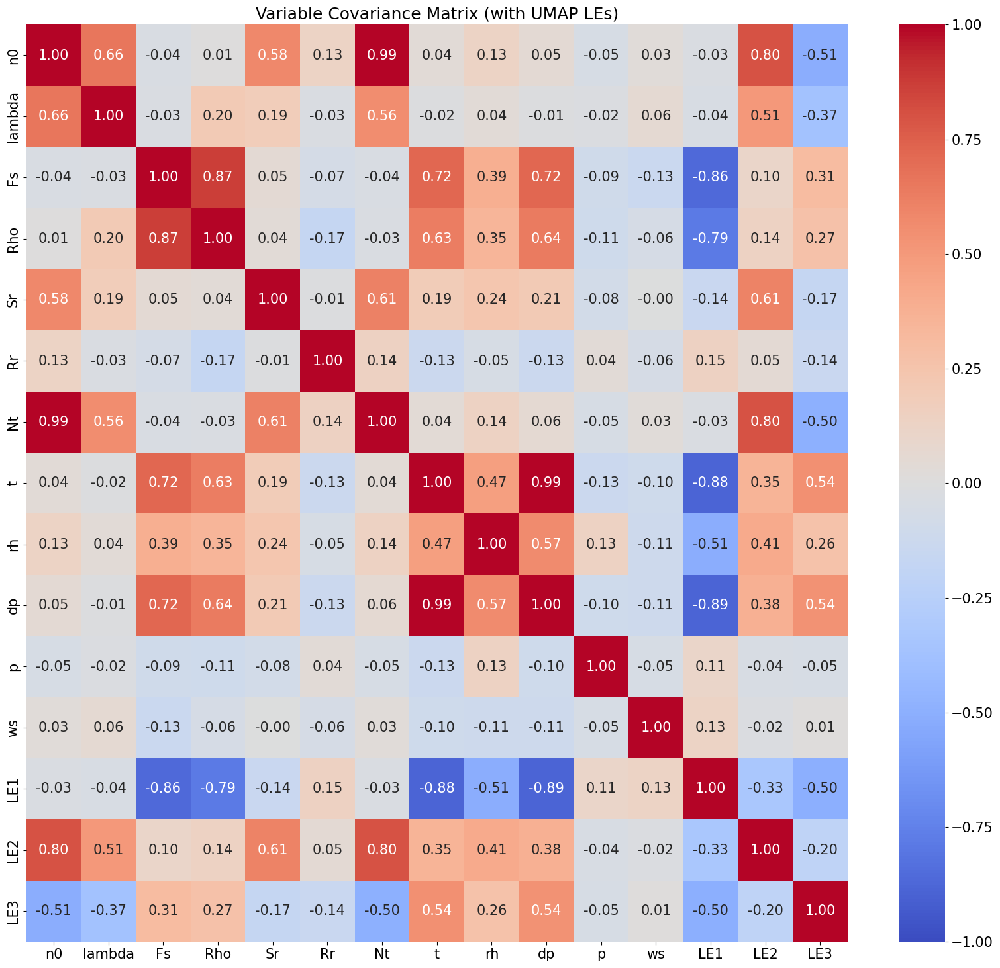

In [22]:
# plot_cov_matrix_with_embeddings(): Makes a similar figure to plot_conv_matrix, but alsoincludes the umap LEs for comparison
def plot_cov_matrix_with_embeddings():
    for feature in ['eof1', 'eof2', 'eof3']:
        mean_value = df_all[feature].mean()
        std_value = df_all[feature].std()
        df_all[f"{feature}_norm"] = (df_all[feature] - mean_value) / std_value

    cov_matrix = df_all.loc[:, ['n0_log_norm', 'lambda_log_norm', 'Fs_norm', 'Rho_log_norm', 'Sr_log_norm', 'Rr_log_norm', 'Nt_log_norm', 
                                't_norm', 'rh_norm', 'dp_norm', 'p_norm', 'ws_norm', 'eof1_norm', 'eof2_norm', 'eof3_norm']].cov()

    cov_matrix.rename(columns={"n0_log_norm": "n0",
                            "lambda_log_norm": "lambda",
                            "Fs_norm": "Fs",
                            "Rho_log_norm": "Rho",
                            "Sr_log_norm": "Sr",
                            "Rr_log_norm": "Rr",
                            "Nt_log_norm": "Nt",
                            "t_norm": "t",
                            "rh_norm": "rh",
                            "dp_norm": "dp",
                            "p_norm": "p",
                            "ws_norm": "ws",
                            "eof1_norm": "LE1",
                            "eof2_norm": "LE2",
                            "eof3_norm": "LE3"}, inplace=True)
    
    plt.figure(figsize=(20, 18))
    sns.heatmap(cov_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1,
                xticklabels=cov_matrix.columns, yticklabels=cov_matrix.columns)
    plt.title('Variable Covariance Matrix (with UMAP LEs)')
    plt.show()

plot_cov_matrix_with_embeddings()   

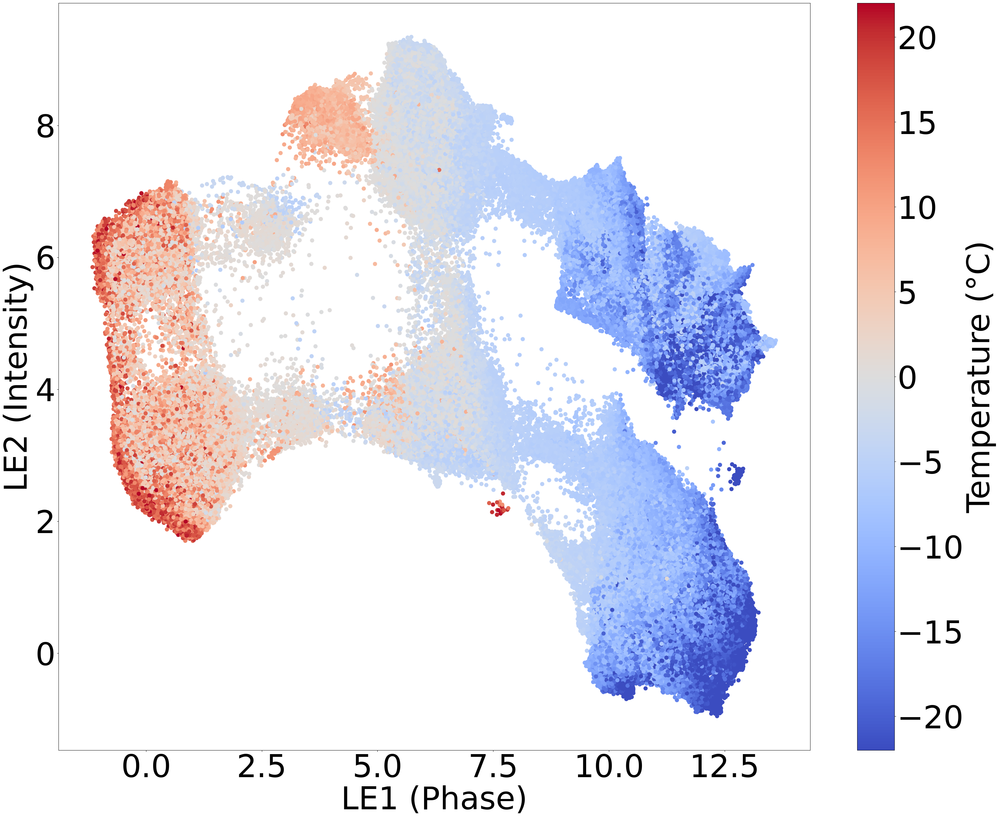

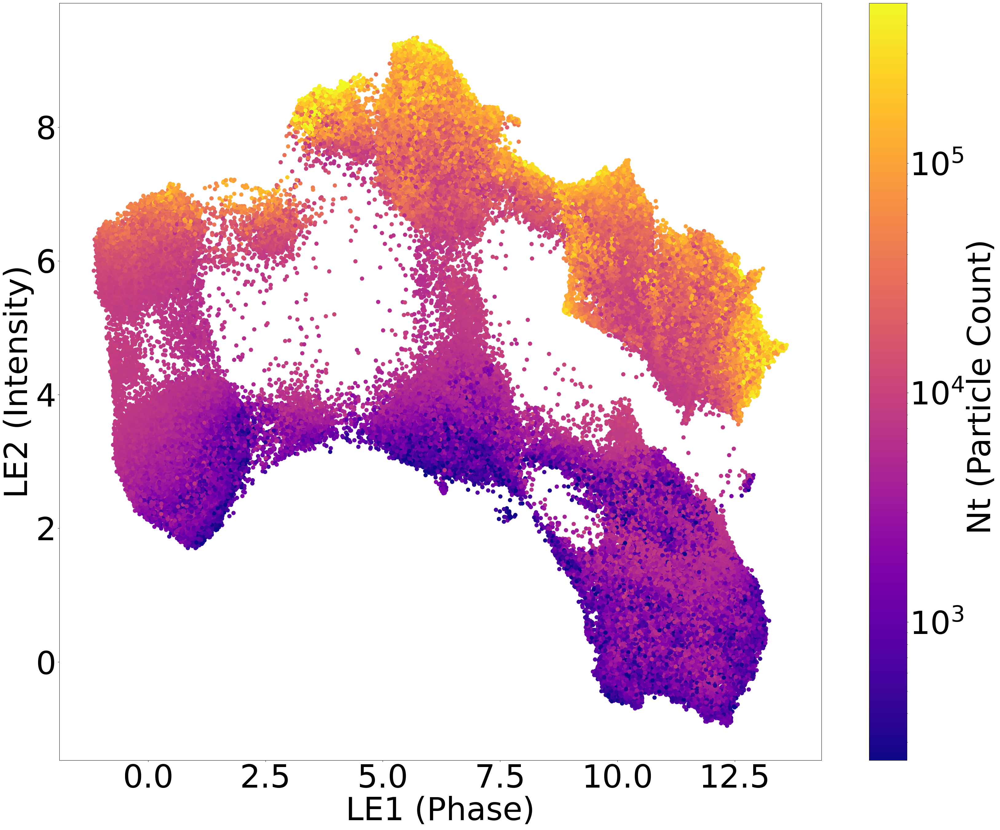

In [23]:
# plot_umap_joint_dists(): Viz function for plotting 2d scatters of various UMAP variables, colored by related MET variables
def plot_umap_joint(df, col, norm, lab1, lab2, xlab, ylab, cmap, title, units):
    plt.rcParams.update({'font.size': 75})
    fig, ax = plt.subplots(figsize=(40,32))
    plt.ylabel(xlab)
    plt.xlabel(ylab)
    if norm:
        scatter = plt.scatter(df[lab1], df[lab2], s=80, c=col, cmap=cmap, norm=LogNorm(vmin=250, vmax=500000), alpha=1)
    else:
        scatter = plt.scatter(df[lab1], df[lab2], s=80, c=col, cmap=cmap, alpha=1, vmin=-22, vmax=22)
    # plt.scatter(df_all[df_all['hdb_cluster'] == 0][lab1], df_all[df_all['hdb_cluster'] == 0][lab2], s=3, alpha=0.25, color='black')
    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label(f'{title} {units}')
    plt.show()

plot_umap_joint(pd.DataFrame(data={'eof1': df_all['eof1'], 'eof2': df_all['eof2']}), df_all['t'], False, 'eof1', 'eof2', 'LE2 (Intensity)', 'LE1 (Phase)', 'coolwarm', 'Temperature', '(°C)')
plot_umap_joint(pd.DataFrame(data={'eof1': df_all['eof1'], 'eof2': df_all['eof2']}), df_all['Nt'], True, 'eof1', 'eof2', 'LE2 (Intensity)', 'LE1 (Phase)', 'plasma', 'Nt (Particle Count)', '')

In [24]:
# plot_umap_le_vs_variables(): Another visualization function for looking at the distribution of variables for different LEs
def plot_umap_le_vs_variables(df):
    sns.set(style="white", font='DejaVu Sans', font_scale = 1.75)
    joint_plot = sns.jointplot(x='eof1', y='t', data=df, kind='hex', cmap='Blues',
                            norm=LogNorm(),
                            gridsize=75,
                            marginal_kws={'bins': 75, 'kde': True, 'color': 'blue'},
                            height=10, ratio=4)

    joint_plot.fig.set_figwidth(18)
    joint_plot.fig.set_figheight(18)
    joint_plot.plot_joint(sns.kdeplot, cmap='Blues_r', zorder=1001, levels=5, linewidths=3)
    joint_plot.set_axis_labels('UMAP LE1', 'Temperature (deg C)')
    cax = joint_plot.fig.add_axes([1, 0.1, 0.03, 0.7])
    color_bar1 = plt.colorbar(joint_plot.ax_joint.collections[0], cax=cax, orientation='vertical')
    color_bar1.set_label('Density')
    plt.show()


    sns.set(style="white", font='DejaVu Sans', font_scale = 1.75)
    joint_plot = sns.jointplot(x='eof2', y='n0_log', data=df, kind='hex', cmap='Reds',
                            norm=LogNorm(),
                            gridsize=75,
                            marginal_kws={'bins': 75, 'kde': True, 'color': 'red'},
                            height=10, ratio=4)

    joint_plot.fig.set_figwidth(18)
    joint_plot.fig.set_figheight(18)
    joint_plot.plot_joint(sns.kdeplot, cmap='Reds_r', zorder=1001, levels=5, linewidths=3)
    joint_plot.set_axis_labels('UMAP LE2', 'Log$_{10}$(N$_{0}$) (mm$^{-3}$ mm$^{-1}$)')
    cax2 = joint_plot.fig.add_axes([1, 0.1, 0.03, 0.7])
    color_bar2 = plt.colorbar(joint_plot.ax_joint.collections[0], cax=cax2, orientation='vertical')
    color_bar2.set_label('Density')
    plt.show()

    sns.set(style="white", font='DejaVu Sans', font_scale = 1.75)
    joint_plot = sns.jointplot(x='eof3', y='lambda_log', data=df, kind='hex', cmap='Oranges',
                            norm=LogNorm(),
                            gridsize=75,
                            marginal_kws={'bins': 75, 'kde': True, 'color': 'orange'},
                            height=10, ratio=4)

    joint_plot.ax_joint.set_ylim((-0.6, 0.25))
    joint_plot.fig.set_figwidth(18)
    joint_plot.fig.set_figheight(18)
    joint_plot.plot_joint(sns.kdeplot, cmap='Reds_r', zorder=1001, levels=5, linewidths=3)
    joint_plot.set_axis_labels('UMAP LE3', 'Log$_{10}$($\lambda$) (mm$^{-1)}$)')
    cax2 = joint_plot.fig.add_axes([1, 0.1, 0.03, 0.7])
    color_bar2 = plt.colorbar(joint_plot.ax_joint.collections[0], cax=cax2, orientation='vertical')
    color_bar2.set_label('Density')
    plt.show()
    

# plot_umap_le_vs_variables(df_all)

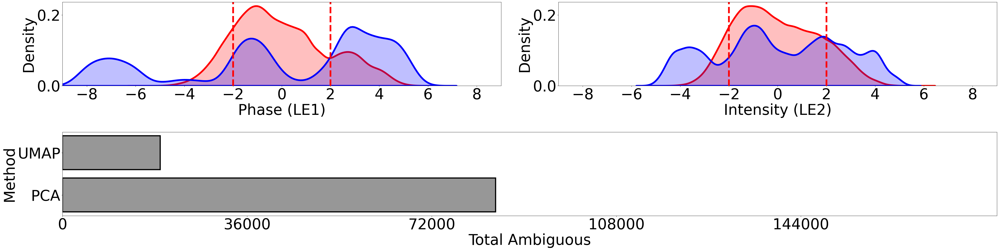

In [25]:
# make_1d_kde_comparisons(): Viz for comparing PCA and UMAP LEs
def make_1d_kde_comparisons(df):
    plt.rcParams.update({'font.size': 52})
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(50, 14))
    df['eof1_centered'] = df['eof1'] - df['eof1'].mean()
    df['eof2_centered'] = df['eof2'] - df['eof2'].mean()
    df['eof3_centered'] = df['eof3'] - df['eof3'].mean()

    sns.kdeplot(data=df['pca_eof1'], ax=axs[0][0], color='red', linewidth=6, fill=True)
    sns.kdeplot(data=df['eof1_centered'], ax=axs[0][0], color='blue', linewidth=6, fill=True)
    axs[0][0].set_xlabel('Phase (LE1)')
    axs[0][0].set_xlim((-9, 9))
    axs[0][0].axvline(-2, linestyle='--', linewidth=6, color='red')
    axs[0][0].axvline(2, linestyle='--', linewidth=6, color='red')

    sns.kdeplot(data=df['pca_eof2'], ax=axs[0][1], color='red', linewidth=6, label='PCA EOF2', fill=True)
    sns.kdeplot(data=df['eof2_centered'], ax=axs[0][1], color='blue', linewidth=6, label='EOF2 Centered', fill=True)
    axs[0][1].set_xlabel('Intensity (LE2)')
    axs[0][1].set_xlim((-9, 9))
    axs[0][1].axvline(-2, linestyle='--', linewidth=6, color='red')
    axs[0][1].axvline(2, linestyle='--', linewidth=6, color='red')

    fig.delaxes(axs[1][0])
    fig.delaxes(axs[1][1])    
    axs[1][1] = fig.add_subplot(2, 1, 2)

    axs[1][1].barh(['PCA', 'UMAP'], [(df_all['pca_groups'] == 7).sum(), (df_all['hdb_cluster'] == 0).sum()], color=['#979797', '#979797'], edgecolor=['black', 'black'], linewidth=4, alpha=1)
    axs[1][1].set_xlim((0, len(df_all)))
    axs[1][1].set_ylabel('Method')
    axs[1][1].set_xlabel('Total Ambiguous')

    xticks = axs[1][1].get_xticks()
    axs[1][1].set_xticks(np.arange(0, 180000, 36000))

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.2)

    plt.show()

make_1d_kde_comparisons(df_all)


In [26]:
# make_1d_kde_comparisons(): Viz for comparing PCA and UMAP LEs
def make_1d_kde_comparisons(df):
    plt.rcParams.update({'font.size': 52})
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(50, 14))
    df['eof1_centered'] = df['eof1'] - df['eof1'].mean()
    df['eof2_centered'] = df['eof2'] - df['eof2'].mean()
    df['eof3_centered'] = df['eof3'] - df['eof3'].mean()

    sns.kdeplot(data=df['pca_eof1'], ax=axs[0][0], color='red', linewidth=6, fill=True)
    sns.kdeplot(data=df['eof1_centered'], ax=axs[0][0], color='blue', linewidth=6, fill=True)
    axs[0][0].set_xlabel('Phase (LE1)')
    axs[0][0].set_xlim((-9, 9))
    axs[0][0].axvline(-2, linestyle='--', linewidth=6, color='red')
    axs[0][0].axvline(2, linestyle='--', linewidth=6, color='red')

    sns.kdeplot(data=df['pca_eof2'], ax=axs[0][1], color='red', linewidth=6, label='PCA EOF2', fill=True)
    sns.kdeplot(data=df['eof2_centered'], ax=axs[0][1], color='blue', linewidth=6, label='EOF2 Centered', fill=True)
    axs[0][1].set_xlabel('Intensity (LE2)')
    axs[0][1].set_xlim((-9, 9))
    axs[0][1].axvline(-2, linestyle='--', linewidth=6, color='red')
    axs[0][1].axvline(2, linestyle='--', linewidth=6, color='red')

    fig.delaxes(axs[1][0])
    
    axs[1][1] = fig.add_subplot(2, 1, 2)
    axs[1][1].barh(['PCA', 'UMAP'], [(df_all['pca_groups'] == 7).sum(), (df_all['hdb_cluster'] == 0).sum()], color=['#f5c2c1', '#bfbffa'], edgecolor=['red', 'blue'], linewidth=4, alpha=1)
    axs[1][1].set_xlim((0, len(df_all)))
    axs[1][1].set_ylabel('Method')
    axs[1][1].set_xlabel('Total Ambiguous')

    xticks = axs[1][1].get_xticks()
    axs[1][1].set_xticks(np.arange(0, 180000, 36000))

    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='#f5c2c1', edgecolor='red', label='PCA'),
        Patch(facecolor='#bfbffa', edgecolor='blue', label='UMAP'),
        Patch(facecolor='#979797', edgecolor='black', label='Ambiguous')
    ]
    axs[1][1].legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=3)
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.2)
    plt.show()

# make_1d_kde_comparisons(df_all)


In [27]:
# plot_hdb_clusters(): Plots the HDBScan clusters for the UMAP embeddings
def plot_hdb_clusters(df, lab1, lab2):
    unique_clusters = np.unique(df_all['hdb_cluster'])
    df['cluster_db'] = df_all['hdb_cluster'].values

    cluster_colors = {cluster: color for cluster, color in zip(unique_clusters, colors)}
    point_colors = [cluster_colors[cluster] for cluster in df['cluster_db']]

    fig, ax = plt.subplots(figsize=(18,18))
    plt.title("HDBScan Clusters")
    plt.ylabel(lab2)
    plt.xlabel(lab1)

    plt.scatter(df[lab1], df[lab2], s=4, color=point_colors, alpha=1)
    legend_elements = [mpatches.Patch(color=color, label=('Ambiguous' if cluster == 0 else f'Cluster {cluster}'))
                    for cluster, color in cluster_colors.items()]
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)
    plt.show()

    plt.rcParams.update({'font.size': 42})
    fig, ax = plt.subplots(figsize=(16,16))
    # plt.grid()
    ax.set_xlim((-0.5, 0.25))
    ax.set_ylim((0, 5))
    # sns.histplot(df_all, x="lambda_log", y="n0_log", hue="cluster_db", palette=point_colors)#, hue_order=[1, 2,3 ,4 ,5], palette={2:'#2b645f', 1:'#84541e'})
    # sns.kdeplot(df_all, x="lambda_log", y="n0_log", hue="hdb_cluster", palette=cluster_colors, levels=2, linewidths=5)#, hue_order=[1, 2], levels=5, linewidths=4, palette={2:'#2b645f', 1:'#84541e'})
    plt.legend([],[], frameon=False)
    plt.xlabel("Log$_{10}$($\lambda$) (mm$^{-1)}$)")
    plt.ylabel("Log$_{10}$(N$_{0}$) (mm$^{-3}$ mm$^{-1}$)")
    plt.title("N0 v. lambda")
    plt.show()

    plt.rcParams.update({'font.size': 42})
    fig, ax = plt.subplots(figsize=(16,16))
    # plt.grid()
    ax.set_xlim((-2.25, 0.1))
    ax.set_ylim((0, 7))
    # sns.histplot(df_all, x="Rho_log", y="Fs", hue="cluster_db", palette=point_colors)#, hue_order=[1, 2], palette={2:'#2b645f', 1:'#84541e'})
    # sns.kdeplot(df_all, x="Rho_log", y="Fs", hue="hdb_cluster", palette=cluster_colors, levels=2, linewidths=5)#, hue_order=[1, 2], levels=5, linewidths=4, palette={2:'#2b645f', 1:'#84541e'})
    plt.legend([],[], frameon=False)
    ax.set_xlabel("Log$_{10}$(Rho) (g cm$^{-3}$)")
    ax.set_ylabel("Fs (m s$^{-1}$)")
    plt.title("Fs v. Rho")
    plt.show()

    plt.rcParams.update({'font.size': 42})
    fig, ax = plt.subplots(figsize=(16,16))
    # plt.grid()
    ax.set_xlim((-43, 35))
    ax.set_ylim((1.5, 7))
    # sns.histplot(df_all, x="Rho_log", y="Fs", hue="cluster_db", palette=point_colors)#, hue_order=[1, 2], palette={2:'#2b645f', 1:'#84541e'})
    # sns.kdeplot(df_all, x="t", y="Fs", hue="hdb_cluster", palette=cluster_colors, levels=2, linewidths=5)#, hue_order=[1, 2], levels=5, linewidths=4, palette={2:'#2b645f', 1:'#84541e'})
    plt.legend([],[], frameon=False)
    ax.set_xlabel("T (deg C)")
    ax.set_ylabel("Nt")
    plt.title("Fs v. T")
    plt.show()



# plot_hdb_clusters(pd.DataFrame(data={'eof2': df_all['eof2'], 'eof3': df_all['eof3']}), 'eof2', 'eof3')
# plot_hdb_clusters(pd.DataFrame(data={'eof1': df_all['eof1'], 'eof2': df_all['eof2']}), 'eof1', 'eof2')

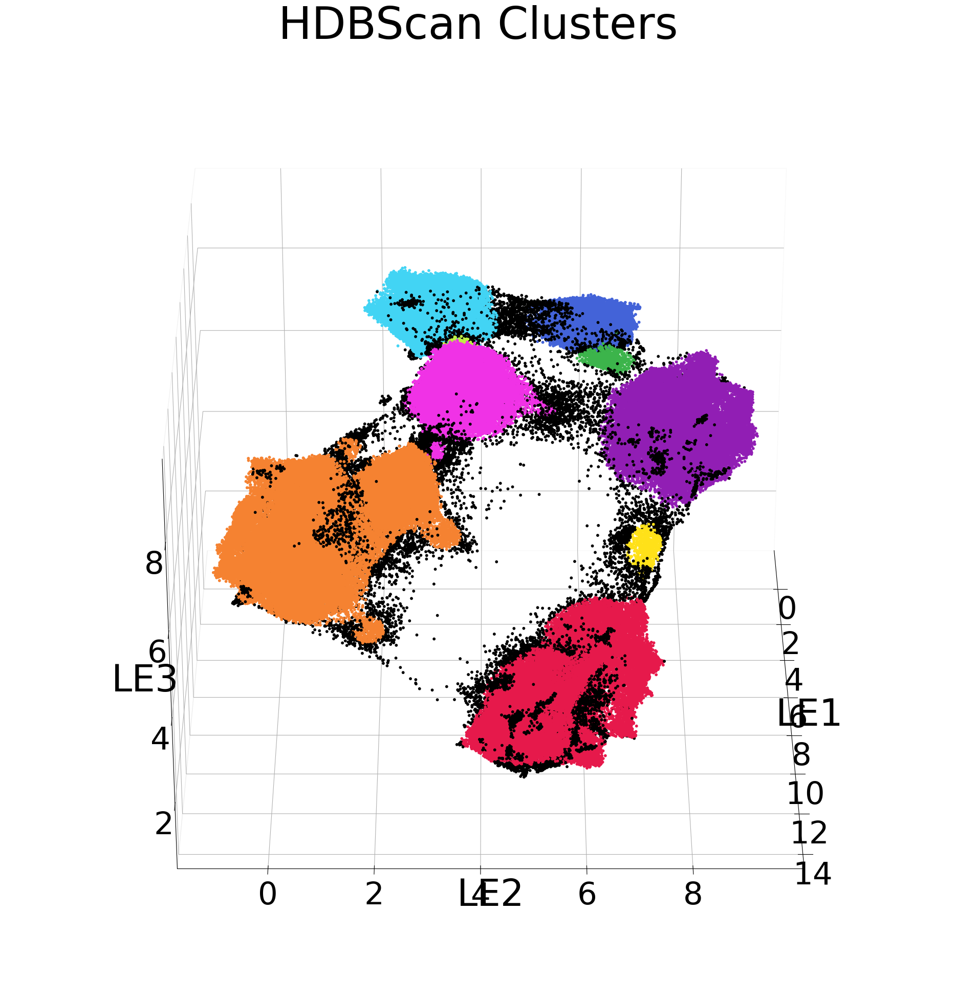

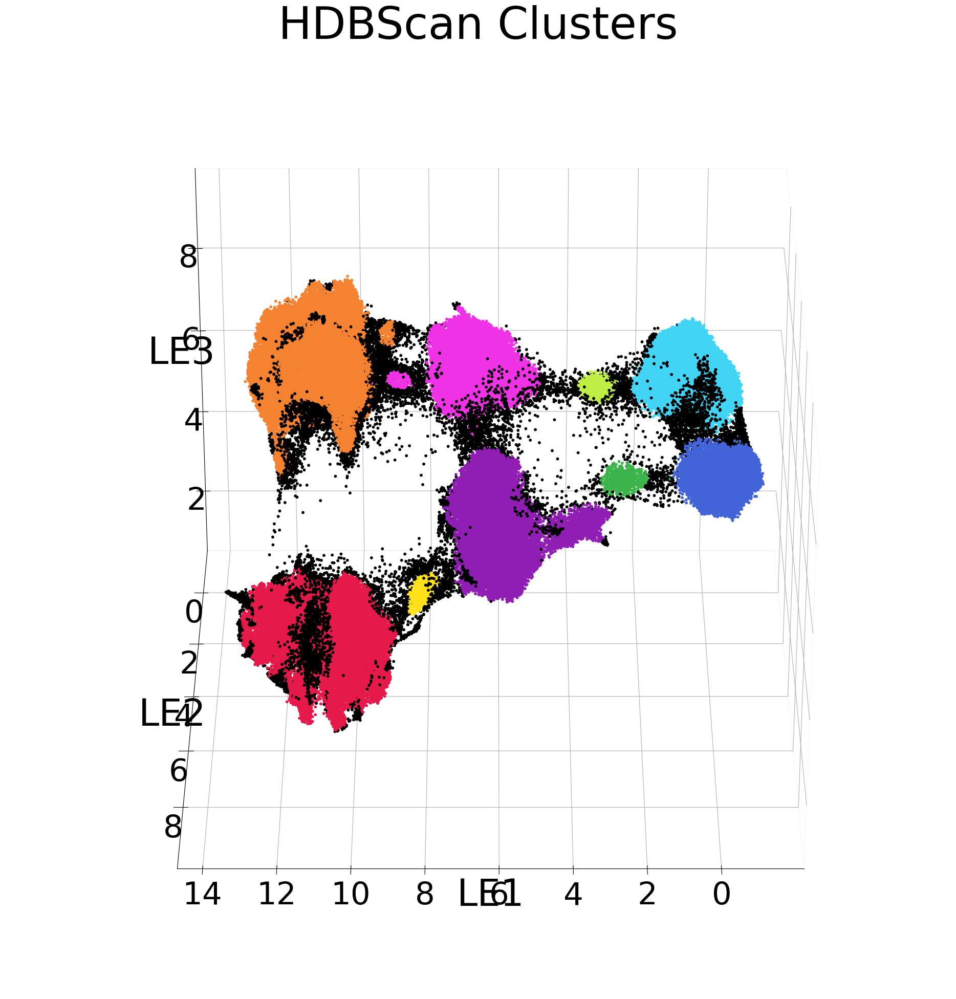

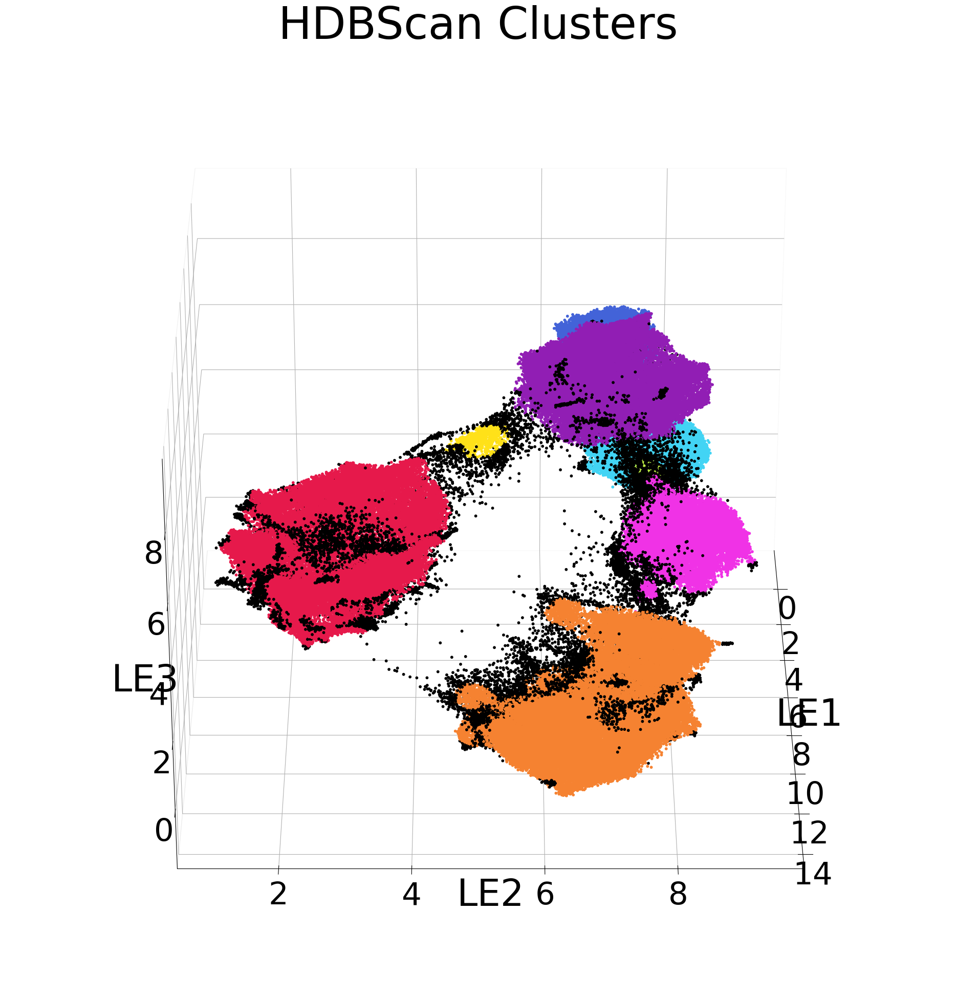

In [28]:

def plot_hdb_clusters(df, lab1, lab2, lab3, elev=30, azim=90):
    unique_clusters = np.unique(df_all['hdb_cluster'])
    df['cluster_db'] = df_all['hdb_cluster'].values

    cluster_colors = {cluster: color for cluster, color in zip(unique_clusters, colors)}
    point_colors = [cluster_colors[cluster] for cluster in df['cluster_db']]

    fig = plt.figure(figsize=(24, 24))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("HDBScan Clusters")
    ax.set_xlabel('LE1')
    ax.set_ylabel('LE2')
    ax.set_zlabel('LE3')
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.tick_params(axis='x', which='major', labelsize=44)
    ax.tick_params(axis='y', which='major', labelsize=44)
    ax.tick_params(axis='z', which='major', labelsize=44)
    ax.grid(True)

    ax.scatter(df['eof1'], df['eof2'], df['eof3'], s=10, c=point_colors, alpha=1)    
    ax.view_init(elev=elev, azim=azim)
    
    plt.show()


plot_hdb_clusters(pd.DataFrame(data={'eof1': df_all['eof1'], 'eof2': df_all['eof2'], 'eof3': df_all['eof3']}), 'eof1', 'eof2', 'eof3', azim=0)
plot_hdb_clusters(pd.DataFrame(data={'eof1': df_all['eof1'], 'eof2': df_all['eof2'], 'eof3': df_all['eof3']}), 'eof1', 'eof2', 'eof3', azim=90)
plot_hdb_clusters(pd.DataFrame(data={'eof1': df_all['eof1'], 'eof2': df_all['eof3'], 'eof3': df_all['eof2']}), 'eof1', 'eof2', 'eof3', elev=30, azim=0)

In [29]:
# plot_site_concentrations_in_umap_le_space(): This Viz function plots the points from each site in UMAP LE1/LE2 space
#                                              So that we can see where clusters are forming wrt. one another
def plot_site_concentrations_in_umap_le_space(df):
    sites = df['site'].unique()
    alphas = [0.008, 0.03, 0.03, 0.025, 0.03, 0.025, 0.075]
    print(sites)

    fig, axes = plt.subplots(2, 4, figsize=(28,13), sharex=True, sharey=True)
    axes = axes.flatten()
    plt.title('site comparison')
    for i,site in enumerate(sites):
        sub_df = df[df['site'] == site]
        axes[i].set_xlim((-4, 15))
        axes[i].set_ylim((-3, 12))
        axes[i].scatter(sub_df['eof1'], sub_df['eof2'], s=6, color='black', alpha=alphas[i])
        axes[i].set_title(site)

    axes[7].set_xlim((-4, 15))
    axes[7].set_ylim((-3, 12))
    fig.supylabel('UMAP LE2')
    fig.supxlabel('UMAP LE1')
    axes[7].scatter(df['eof1'], df['eof2'], s=6, color='black', alpha=0.005)
    axes[7].set_title('All Sites')
    plt.show()

# plot_site_concentrations_in_umap_le_space(df_all)

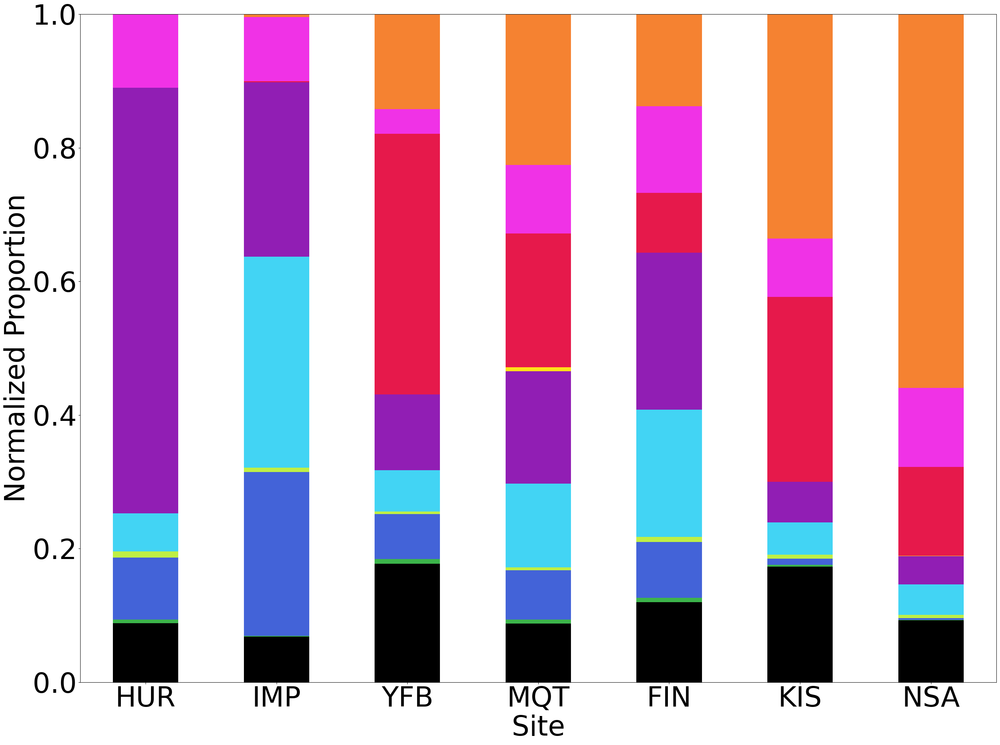

In [30]:
# plot_hdb_cluster_proportions(): Similar to the JAS paper, this plots the normalized proportion of different clusters by site
def plot_hdb_cluster_proportions():
    count_df = pd.crosstab(df_all['site'], df_all['hdb_cluster'])
    normalized_df = count_df.div(count_df.sum(axis=1), axis=0)
    normalized_df = normalized_df.sort_values(by=7)
    new_order = ['HUR', 'IMP', 'YFB', 'MQT', 'FIN', 'KIS', 'NSA']
    normalized_df = normalized_df.loc[new_order]
    plt.rcParams.update({'font.size': 55})
    fig, ax = plt.subplots(figsize=(29,22))
    ax = normalized_df.plot(kind='bar', stacked=True, color=colors, legend=None, ax=ax)
    plt.xticks(rotation=0)
    plt.xlabel('Site')
    plt.ylabel('Normalized Proportion')
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()

plot_hdb_cluster_proportions()

In [31]:
# plot_umap_variable_spaces(): Viz function for plotting the giant UMAP clusters in different physical variable spaces
def plot_umap_variable_spaces(mapping, palette, label):
    df_all['temp_cluster'] = df_all['hdb_cluster'].map(mapping)
    df_filtered = df_all[df_all['temp_cluster'] != 0]

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-0.5, 0.25))
    ax.set_ylim((0, 5))
    sns.histplot(df_filtered, x="lambda_log", y="n0_log", hue="temp_cluster", palette=palette)
    sns.kdeplot(df_filtered, x="lambda_log", y="n0_log", hue="temp_cluster", linewidths=2, palette=palette)
    plt.legend([],[], frameon=False)
    plt.xlabel("Log$_{10}$($\lambda$) (mm$^{-1)}$)")
    plt.ylabel("Log$_{10}$(N$_{0}$) (mm$^{-3}$ mm$^{-1}$)")
    plt.title(label)
    plt.show()

    plt.rcParams.update({'font.size': 24})
    fig, ax = plt.subplots(figsize=(12,12))
    plt.grid()
    ax.set_xlim((-2, -0))
    ax.set_ylim((0, 6.5))
    sns.histplot(df_filtered, x="Rho_log", y="Fs", hue="temp_cluster", palette=palette)
    sns.kdeplot(df_filtered, x="Rho_log", y="Fs", hue="temp_cluster", linewidths=2, palette=palette)
    plt.legend([],[], frameon=False)
    ax.set_xlabel("Log$_{10}$(Rho) (g cm$^{-3}$)")
    ax.set_ylabel("Fs (m s$^{-1}$)")
    plt.title(label)
    plt.show()

# Right now I manually assign groups, but we could easily automate this...
cluster_mapping_le1 = {
    0: 0,
    2: 10, 4: 10,
    1: 11, 3: 11, 5: 11, 6: 11, 7: 11, 10: 11,
    7: 12, 9: 12
}

cluster_mapping_le2 = {
    0: 0,
    1: 11, 2: 11, 3: 12, 4: 12, 5: 11, 6: 11, 7: 11, 8: 12, 9: 12, 10: 11,
}

cluster_mapping_le3 = {
    0: 0,
    1: 11, 2: 12,
    3: 11, 4: 11, 5: 11, 6: 12, 7: 12, 8: 12, 9: 11, 10: 11,
}

# plot_umap_variable_spaces(cluster_mapping_le1, {10:'#227fc0', 11:'#fc7d0c', 12:'purple'}, 'UMAP - LE1')
# plot_umap_variable_spaces(cluster_mapping_le2, {11:'#227fc0', 12:'#fc7d0c'}, 'UMAP - LE2')
# plot_umap_variable_spaces(cluster_mapping_le3, {11:'#227fc0', 12:'#fc7d0c'}, 'UMAP - LE3')

In [32]:
# complex_plot(): Viz function for plotting outlines of clusters (used in figures)
def complex_plot(df):
    unique_clusters = np.unique(df_all['hdb_cluster'])
    df['cluster_db'] = df_all['hdb_cluster'].values
    cluster_colors = {cluster: color for cluster, color in zip(unique_clusters, colors)}
    patches = []

    FONT = 54
    plt.rcParams.update({'font.size': 54})
    fig, axs = plt.subplots(1, 1, figsize=(36, 36))
    axs.scatter(df['eof1'], df['eof2'], color='white', s=250)
    axs.set_xlabel('LE1', fontsize=FONT)
    axs.set_ylabel('LE2', fontsize=FONT)

    kde = sns.kdeplot(data=df[df['hdb_cluster'] != 0], x='eof1', y='eof2', hue='hdb_cluster', palette=cluster_colors, levels=2, linewidths=12, legend=False, cbar=False, ax=axs)
    
    for contour in kde.collections:
        contour.set_linestyle('--')

    for cluster, color in zip(unique_clusters, colors):
        if cluster != 0:
            patches.append(mpatches.Patch(color=color, label=f'Cluster {cluster}'))

    axs.tick_params(axis='both', which='major', labelsize=FONT-4)
    axs.tick_params(axis='both', which='minor', labelsize=FONT-4)
    plt.legend(handles=patches, fontsize=FONT-10)
    plt.show()

# complex_plot(df_all)

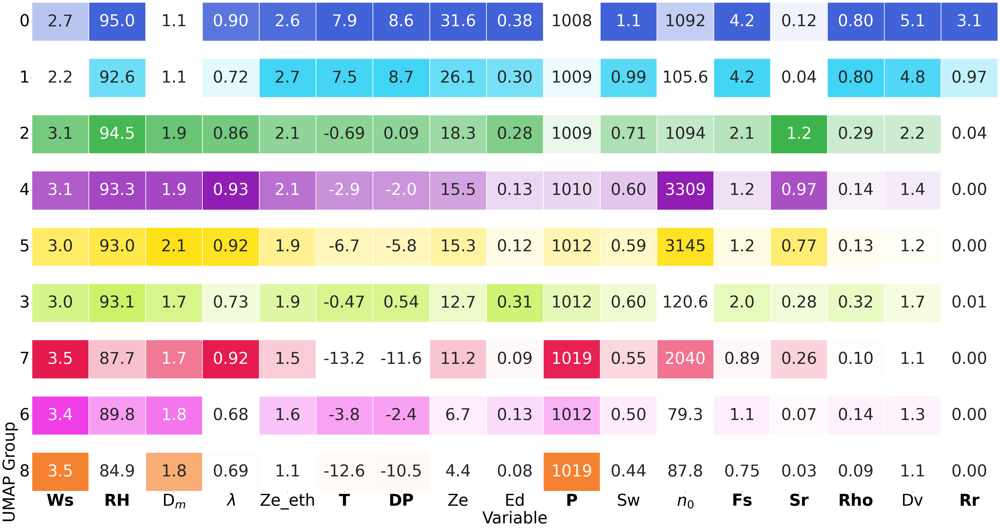

In [33]:
# create_variable_heatmap(): Viz function for plotting the variable heatmap used in Figure 5 in the manuscript
def create_variable_heatmap():
    # define a few helper functions
    def annotate_values(val):
        val = float(val)
        if abs(val) < 1:
            return f'{val:.2f}'
        elif val < 1000.0:
            return f'{val:.1f}'
        else:
            return f'{val:.0f}'

    def interpolate_color(hex_color, percentage):
        hex_color = hex_color.lstrip('#')
        rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
        white = (255, 255, 255)
        interpolated_rgb = tuple(int(white[i] + (rgb[i] - white[i]) * percentage) for i in range(3))
        return '#{:02x}{:02x}{:02x}'.format(*interpolated_rgb)

    mean_mqt_df = pd.read_csv('mqt_mean_cluster_stats.csv')
    mean_mqt_df = mean_mqt_df[:-1]

    columns_names = ['Ws', 'RH', 'D$_m$', '$\lambda$', 'Ze_eth', 'T', 'DP', 'Ze', 'Ed', 'P', 'Sw', '$n_0$', 'Fs', 'Sr', 'Rho', 'Dv', 'Rr']
    columns = ['n0_mean', 'n0_std', 'lambda_mean', 'lambda_std', 'fs_mean', 'fs_std', 'sr_mean', 'sr_std', 'rr_mean', 'rr_std', 'rho_mean', 'rho_std', 't_mean', 't_std', 'rh_mean', 'rh_std', 'p_mean', 'p_std', 'refl_mean', 'refl_std', 'dv_mean', 'dv_std', 'sw_mean', 'sw_std', 'cth_mean', 'cth_std', 'dm_mean', 'dm_std', 'ws_mean', 'ws_std', 'ed_mean', 'ed_std', 'dp_mean', 'dp_std']
    columns_norm = [col + '_norm' for col in columns]

    scaler = MinMaxScaler()
    mean_mqt_df[columns_norm] = scaler.fit_transform(mean_mqt_df[columns])
    means_norm = mean_mqt_df.filter(like='_mean_norm')
    stds_norm = mean_mqt_df.filter(like='_std_norm')
    means_actual = mean_mqt_df.filter(like='_mean')
    column_sums = means_norm.sum().sort_values(ascending=False)
    sorted_columns_norm = column_sums.index
    means_norm_sorted = means_norm[sorted_columns_norm]

    sorted_columns_actual = [col.replace('_norm', '') for col in sorted_columns_norm]
    means_actual_sorted = means_actual[sorted_columns_actual]
    # print(sorted_columns_actual)

    row_sums = means_norm.sum(axis=1)
    means_norm_sorted_rows = means_norm_sorted.loc[row_sums.sort_values(ascending=False).index]
    means_actual_sorted_rows = means_actual_sorted.loc[row_sums.sort_values(ascending=False).index]

    sorted_colors = mean_mqt_df.loc[row_sums.sort_values(ascending=False).index, 'color']
    plt.rcParams.update({'font.size': 52})
    plt.figure(figsize=(46, 25))

    for i, (index, row) in enumerate(means_norm_sorted_rows.iterrows()):
        ax = plt.subplot(means_norm_sorted_rows.shape[0], 1, i + 1)
        color = sorted_colors.iloc[i]
        max_val = np.max(pd.DataFrame(row).T.values)
        new_col = interpolate_color(color, max_val)
        cmap = LinearSegmentedColormap.from_list('custom_cmap', [(0, 'white'), (1, new_col)])
    
        actual_values = means_actual_sorted_rows.loc[index].values.reshape(1, -1)
        annot = pd.DataFrame(np.vectorize(annotate_values)(actual_values), columns=sorted_columns_actual)
        
        sns.heatmap(pd.DataFrame(row).T, annot=annot, cmap=cmap, cbar=False, linewidths=1, edgecolor='black', ax=ax, fmt='')
        ax.set_yticklabels([index], rotation=0)
        if i < means_norm_sorted_rows.shape[0] - 1:
            ax.set_xticklabels([])
            ax.tick_params(axis='x', bottom=False)
        else:
            ax.set_xticklabels(columns_names, rotation=0)
            ax.tick_params(axis='x', bottom=True)

        bold_labels = ['Ws', 'RH', 'DP', '$\lambda$', 'T', 'P', '$n_0$', 'Fs', 'Sr', 'Rho', 'Rr', 'n0']
        for tick in ax.get_xticklabels():
            if tick.get_text() in bold_labels:
                tick.set_fontweight('bold')

    plt.xlabel('Variable')
    plt.ylabel('UMAP Group')
    plt.tight_layout()
    plt.show()

create_variable_heatmap()

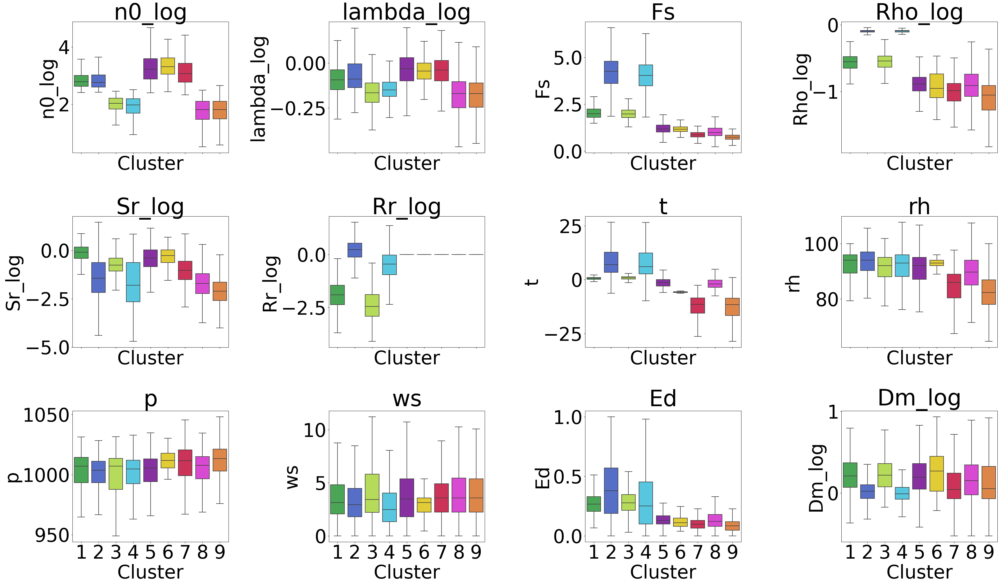

In [34]:
# plot_boxplots_all_clusters(): Another Viz function that makes boxplots showing the distribution of each variable for each HDBScan cluster
def plot_boxplots_all_clusters(df, cluster_col):
    vars_to_examine = ['n0_log', 'lambda_log', 'Fs', 'Rho_log', 'Sr_log', 'Rr_log', 't', 'rh', 'p', 'ws', 'Ed', 'Dm_log']
    clusters = list(range(1, 11))
    df_clusters = df[df[cluster_col].isin(clusters)]
    fig, axes = plt.subplots(3, 4, figsize=(40, 24), sharex=True)
    axes = axes.flatten()

    for i, var in enumerate(vars_to_examine):
        sns.boxplot(
            data=df_clusters,
            x=cluster_col,
            y=var,
            ax=axes[i],
            palette=color_palette2,
            showfliers=False
        )
        axes[i].set_title(var)
        axes[i].set_xlabel('Cluster')
        axes[i].set_ylabel(var)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout()
    plt.show()
    

plot_boxplots_all_clusters(df_all, 'hdb_cluster')

In [35]:
# calculate_statistics(): Helper function used for calculating stats for the manuscript table
def calculate_statistics(df, columns):
    df = df[df['site'] == 'MQT']
    statistics = {}
    for i in range(10):
        if i > 0:
            continue

        filter_df = df[df['hdb_cluster'] == i]
        print(i, len(filter_df))
        print()
        for column in columns:
            mean = filter_df[column].mean()
            std = filter_df[column].std()
            print(f"group {i} {column} : {mean} {std}")
    return statistics

columns_to_calculate = ['Nt', 't']# ['Nt', 'n0', 'lambda', 'Fs', 'Rho', 'Sr', 'Rr', 't', 'rh', 'p', 'ws', 'Ed', 'Dm']
# statistics = calculate_statistics(df_all, columns_to_calculate)

In [36]:
def filter_by_date(df, date_str):
    if not pd.api.types.is_datetime64_any_dtype(df['time']):
        df['time'] = pd.to_datetime(df['time'])

    target_date = pd.to_datetime(date_str).date()
    filtered_df = df[df['time'].dt.date == target_date]
    sorted_df = filtered_df.sort_values(by='time')
    return sorted_df
site_df = df_all[df_all['site'] == 'MQT']
filtered_df = filter_by_date(site_df, '2022-02-21')

def plot_timeseries_of_vars(df, var):
    # print(df)
    fig, ax = plt.subplots(figsize=(12, 5))
    plt.title(var)
    plt.scatter(df['time'], df[var])
    plt.xticks(rotation=90)
    plt.show()

# TODO :: We don't use these anymore
# plot_timeseries_of_vars(filtered_df, 'n0')
# plot_timeseries_of_vars(filtered_df, 'hdb_cluster')
# plot_timeseries_of_vars(filtered_df, 'pca_groups')
# plot_timeseries_of_vars(filtered_df, 'lambda')
# plot_timeseries_of_vars(filtered_df, 't')
# plot_timeseries_of_vars(filtered_df, 'Rho')
# plot_timeseries_of_vars(filtered_df, 'Fs')
# plot_timeseries_of_vars(filtered_df, 'p')
# plot_timeseries_of_vars(filtered_df, 'Dm')
# plot_timeseries_of_vars(filtered_df, 'rh')
# plot_timeseries_of_vars(filtered_df, 'Sr')
# plot_timeseries_of_vars(filtered_df, 'ws')

/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/3704960823.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time'] = pd.to_datetime(df['time'])


Working on path None


/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:190: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([0, 0, 2])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:196: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels([0, 0, 2])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:218: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[4, j].set_xticklabels(['', '06:15', '10:25', '14:35', '18:45', '22:55', '03:05'])


Working on path MRR_NWS_MQT_20160128_snow.nc


/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:190: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([0, 0, 2])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:196: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels([0, 0, 2])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:218: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[4, j].set_xticklabels(['', '06:15', '10:25', '14:35', '18:45', '22:55', '03:05'])


Working on path MRR_NWS_MQT_20230215_snow.nc


/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:190: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([0, 0, 2])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:196: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels([0, 0, 2])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/1729054347.py:218: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[4, j].set_xticklabels(['', '06:15', '10:25', '14:35', '18:45', '22:55', '03:05'])


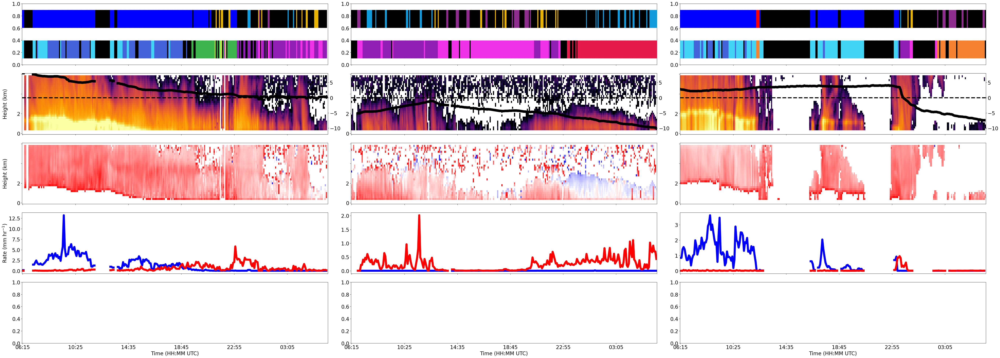

In [37]:
# get_two_day_data(): Helper function for getting multiple days worth of data (harder since data is stored in daily files)
def get_two_day_data(df):
    MQT_PATH = '/Users/fraserking/Desktop/umap_precip/interesting_cases/'
    paths = ['MRR_NWS_MQT_20171024_snow.nc', 'MRR_NWS_MQT_20171025_snow.nc', 'MRR_NWS_MQT_20171026_snow.nc', 'MRR_NWS_MQT_20171027_snow.nc']
    palette_pca = ['red', '#0f9adb', 'blue', '#8d2c8d', '#e8b400', '#007e58', 'black', 'black']
    offset = 75

    if not pd.api.types.is_datetime64_any_dtype(df['time']):
        df['time'] = pd.to_datetime(df['time'])

    def reshape_to_5min_intervals(nc_file_path):
        nc_data = xr.open_dataset(MQT_PATH + nc_file_path)
        nc_data = nc_data[['time', 'Ze', 'W', 'spectralWidth']]
        nc_resampled = nc_data.resample(time='5Min').mean()
        return nc_resampled

    zh_data_list = []
    dv_data_list = []
    sw_data_list = []
    hdb_cluster = []
    pca_cluster = []
    sr_values = []
    rr_values = []
    t_values = []
    rh_values = []
    p_values = []
    date_list = []

    for path in paths:
        resampled_nc_data = reshape_to_5min_intervals(path)

        for nc_time in resampled_nc_data['time'].values:
            nc_datetime = pd.to_datetime(str(nc_time))
            closest_row = df.iloc[(df['time'] - nc_datetime).abs().argsort()[:1]]
            date_list.append(nc_datetime)

            if not closest_row.empty:
                closest_time = closest_row['time'].values[0]
                time_difference = abs(nc_datetime - pd.to_datetime(closest_time))

                if time_difference <= timedelta(minutes=5):
                    hdb_cluster.append(closest_row['hdb_cluster'].values[0])
                    pca_cluster.append(closest_row['pca_groups'].values[0])
                    sr_values.append(closest_row['Sr'].values[0])
                    rr_values.append(closest_row['Rr'].values[0])
                    t_values.append(closest_row['t'].values[0])
                    if closest_row['rh'].values[0] > 80:
                        rh_values.append(closest_row['rh'].values[0])
                    else:
                        rh_values.append(np.nan)
                    if closest_row['p'].values[0] > 970:
                        p_values.append(closest_row['p'].values[0])
                    else:
                        p_values.append(np.nan)
                else:
                    hdb_cluster.append(np.nan)
                    pca_cluster.append(np.nan)
                    sr_values.append(np.nan)
                    rr_values.append(np.nan)
                    t_values.append(np.nan)
                    rh_values.append(np.nan)
                    p_values.append(np.nan)
            else:
                hdb_cluster.append(np.nan)
                pca_cluster.append(np.nan)
                sr_values.append(np.nan)
                rr_values.append(np.nan)
                t_values.append(np.nan)
                rh_values.append(np.nan)
                p_values.append(np.nan)

        zh_data_list.append(resampled_nc_data['Ze'][:, :].T)
        dv_data_list.append(resampled_nc_data['W'][:, :].T)
        sw_data_list.append(resampled_nc_data['spectralWidth'][:, :].T)

    zh_data = np.concatenate(zh_data_list, axis=1)
    dv_data = np.concatenate(dv_data_list, axis=1)
    sw_data = np.concatenate(sw_data_list, axis=1)
    dv_data = np.where(dv_data < -3, np.nan, dv_data)
    dv_data = np.where(dv_data > 3, np.nan, dv_data)
    x_values = range(len(hdb_cluster))

    color_map = {i: color_palette[i] for i in range(10)}
    color_map[np.nan] = 'black'

    color_map_pca = {i: palette_pca[i] for i in range(7)}
    color_map_pca[np.nan] = 'black'

    return zh_data[:,offset:288+offset], hdb_cluster[offset:288+offset], pca_cluster[offset:288+offset], dv_data[:,offset:288+offset], \
        sr_values[offset:288+offset], rr_values[offset:288+offset], t_values[offset:288+offset], rh_values[offset:288+offset], p_values[offset:288+offset]

# plot_mmr_met_examples_mqt(): Viz function that plots case studies for Figure 4 in the manuscript (big multiplot)
def plot_mmr_met_examples_mqt(df):
    MQT_PATH = '/Users/fraserking/Desktop/umap_precip/interesting_cases/'
    paths = [None, 'MRR_NWS_MQT_20160128_snow.nc', 'MRR_NWS_MQT_20230215_snow.nc']# 'MRR_NWS_MQT_20220221_snow.nc']
    palette_pca = ['red', '#0f9adb', 'blue', '#8d2c8d', '#e8b400', '#007e58', 'black', 'black']

    if not pd.api.types.is_datetime64_any_dtype(df['time']):
        df['time'] = pd.to_datetime(df['time'])

    plt.rcParams.update({'font.size': 20})
    fig, axes = plt.subplots(5, 3, figsize=(55, 20), sharex=True)

    for j, path in enumerate(paths):
        print("Working on path", path)

        def reshape_to_5min_intervals(nc_file_path):
            nc_data = xr.open_dataset(MQT_PATH + nc_file_path)
            nc_data = nc_data[['time', 'Ze', 'W', 'spectralWidth']]
            nc_resampled = nc_data.resample(time='5Min').mean()
            return nc_resampled

        hdb_cluster = []
        pca_cluster = []
        sr_values = []
        rr_values = []
        t_values = []
        rh_values = []
        p_values = []
        date_list = []
        zh_data = []
        dv_data = []

        if path == None:
            zh_data, hdb_cluster, pca_cluster, dv_data, sr_values, rr_values, t_values, rh_values, p_values = get_two_day_data(df)
        else:
            resampled_nc_data = reshape_to_5min_intervals(path)
            for nc_time in resampled_nc_data['time'].values:
                nc_datetime = pd.to_datetime(str(nc_time))
                closest_row = df.iloc[(df['time'] - nc_datetime).abs().argsort()[:1]]
                date_list.append(nc_datetime)

                if not closest_row.empty:
                    closest_time = closest_row['time'].values[0]
                    time_difference = abs(nc_datetime - pd.to_datetime(closest_time))

                    if time_difference <= timedelta(minutes=5):
                        hdb_cluster.append(closest_row['hdb_cluster'].values[0])
                        pca_cluster.append(closest_row['pca_groups'].values[0])
                        sr_values.append(closest_row['Sr'].values[0])
                        rr_values.append(closest_row['Rr'].values[0])
                        t_values.append(closest_row['t'].values[0])
                        rh_values.append(closest_row['rh'].values[0])
                        p_values.append(closest_row['p'].values[0])
                    else:
                        hdb_cluster.append(np.nan)
                        pca_cluster.append(np.nan)
                        sr_values.append(np.nan)
                        rr_values.append(np.nan)
                        t_values.append(np.nan)
                        rh_values.append(np.nan)
                        p_values.append(np.nan)
                else:
                    hdb_cluster.append(np.nan)
                    pca_cluster.append(np.nan)
                    sr_values.append(np.nan)
                    rr_values.append(np.nan)
                    t_values.append(np.nan)
                    rh_values.append(np.nan)
                    p_values.append(np.nan)

            zh_data = resampled_nc_data['Ze'][:, :].T
            dv_data = resampled_nc_data['W'][:, :].T
            sw_data = resampled_nc_data['spectralWidth'][:, :].T
            dv_data = np.where(dv_data < -3, np.nan, dv_data)
            dv_data = np.where(dv_data > 3, np.nan, dv_data)
        x_values = range(len(hdb_cluster))

        color_map = {i: color_palette[i] for i in range(10)}
        color_map[np.nan] = 'black'

        color_map_pca = {i: palette_pca[i] for i in range(7)}
        color_map_pca[np.nan] = 'black'

        ax0 = axes[0, j]
        for x, group in zip(x_values, hdb_cluster):
            ax0.scatter(x, 0.25, color=color_map[group], marker='|', s=5000, linewidth=5, zorder=1001)
        for x, group in zip(x_values, pca_cluster):
            if np.isnan(group):
                group = 7
            ax0.scatter(x, 0.75, color=color_map_pca[group-1], marker='|', s=5000, linewidth=5, zorder=1001)
        ax0.set_ylim((0, 1))

        if path == 'MRR_NWS_MQT_20230215_snow.nc':
            dataset = nc.Dataset('/Users/fraserking/Development/pca/data/MET_OUT/MQT/20230215_met.nc', 'r')
            t_values = dataset.variables['temperature'][:]

        ax1 = axes[1, j]
        im = ax1.imshow(zh_data, aspect='auto', cmap='inferno', origin='lower', vmin=-10, vmax=30)
        ax1.set_yticklabels([0, 0, 2])
        if j == 0:
            ax1.set_ylabel("Height (km)")

        ax2 = axes[2, j]
        im = ax2.imshow(dv_data, aspect='auto', cmap='bwr', origin='lower', vmin=-3, vmax=3)
        ax2.set_yticklabels([0, 0, 2])
        if j == 0:
            ax2.set_ylabel("Height (km)")

        ax3 = axes[3, j]
        ax3.plot(np.arange(len(rr_values)), rr_values,  label='Rr', color='blue', linewidth=8)
        ax3.plot(np.arange(len(sr_values)), sr_values,  label='Sr', color='red', linewidth=8)
        if j == 0:
            ax3.set_ylabel("Rate (mm hr$^{-1}$)")

        ax4 = ax1.twinx()
        ax4.plot(np.arange(len(t_values)), t_values, color='black', linewidth=10, label='temperature')
        ax4.axhline(0, color='black', linestyle='--', linewidth=4)
        ax4.set_ylim((-12, 8))

        # if j < len(paths) - 1:
        #     ax5.yaxis.set_visible(False)
        #     ax5.spines["right"].set_visible(False)
        #     ax6.yaxis.set_visible(False)
        #     ax6.spines["right"].set_visible(False)


        axes[4, j].set_xticklabels(['', '06:15', '10:25', '14:35', '18:45', '22:55', '03:05'])
        # axes[4, j].set_xticklabels(['', '00:00', '04:10', '8:20', '12:30', '16:40', '20:50'])
        axes[4, j].set_xlabel('Time (HH:MM UTC)')

    fig.align_labels()
    plt.tight_layout()
    plt.show()


plot_mmr_met_examples_mqt(df_all)

In [38]:
# find_cluster_events(): Helper search function for finding interesting cases using transitions between clusters. Pretty neat application!
def find_cluster_events(df, time_col='time', site_col='site', cluster_col='hdb_cluster', top_n=10, target_clusters=[1, 2]):
    df[time_col] = pd.to_datetime(df[time_col])
    df['date'] = df[time_col].dt.date
    
    def analyze_day(group):
        non_zero_clusters = group[group[cluster_col] != 0]
        num_clusters = non_zero_clusters[cluster_col].nunique()
        if num_clusters >= 2:
            cluster_counts = (
                non_zero_clusters[cluster_col]
                .value_counts()
                .to_dict()
            )
            return {
                'site': group[site_col].iloc[0],
                'event_date': group['date'].iloc[0],
                **{f'cluster_{key}': value for key, value in cluster_counts.items()}
            }
        return None
    
    grouped_results = df.groupby([site_col, 'date']).apply(analyze_day).dropna().apply(pd.Series).reset_index(drop=True)
    
    for cluster in range(1, 12):  
        column_name = f'cluster_{cluster}'
        if column_name not in grouped_results.columns:
            grouped_results[column_name] = 0
    
    def total_target_instances(row, target_clusters):
        return sum(row.get(f'cluster_{cluster}', 0) for cluster in target_clusters)
    
    grouped_results['total_instances'] = grouped_results.apply(lambda row: total_target_instances(row, target_clusters), axis=1)
    filtered_results = grouped_results[grouped_results['total_instances'] > 0]
    sorted_results = filtered_results.sort_values(by='total_instances', ascending=False)
    top_results = sorted_results.head(top_n)
    return top_results

result = find_cluster_events(df_all[['site', 'time', 'hdb_cluster']], top_n=20, target_clusters=[4,9])
print(result)


/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/276573768.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[time_col] = pd.to_datetime(df[time_col])
/var/folders/z2/zx7d6rsn0fbg4h705s0036s40000gn/T/ipykernel_8101/276573768.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df[time_col].dt.date


     site  event_date  cluster_9  cluster_7  cluster_5  cluster_4  cluster_2  \
1607  MQT  2023-02-15       32.0        NaN        9.0       79.0       29.0   
1568  MQT  2022-11-30       87.0        9.0        2.0       23.0        NaN   
1570  MQT  2022-12-03       60.0       25.0       47.0        1.0        NaN   
529   MQT  2015-02-07       56.0       88.0        NaN        2.0        NaN   
554   MQT  2015-03-21       36.0        5.0       13.0       14.0        NaN   
925   MQT  2017-12-05       35.0       14.0       15.0        6.0        8.0   
1071  MQT  2018-12-28       13.0       60.0       54.0       18.0       12.0   
825   MQT  2017-02-10       12.0       47.0        NaN       11.0        NaN   
954   MQT  2018-01-11        1.0       26.0       23.0       21.0        1.0   
650   MQT  2016-01-09       17.0        NaN      102.0        2.0        NaN   
376   IMP  2022-02-05        8.0        1.0       26.0        7.0        NaN   
1056  MQT  2018-11-25        7.0        

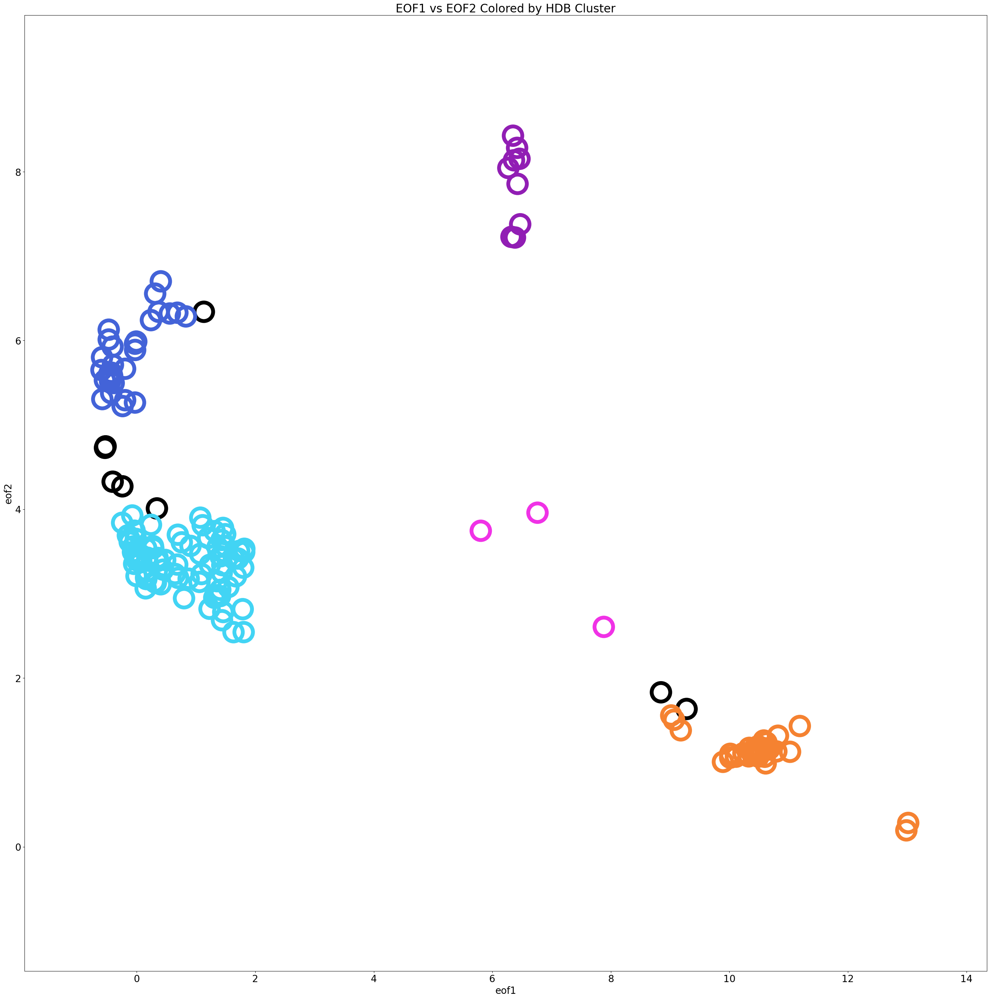

In [39]:
# plot_date(): Viz function we use for plotting discrete events (e.g., Fig.1.b in the manuscript)
def plot_date(df, specific_date):
    df['time'] = pd.to_datetime(df['time'])
    filtered_df = df[df['time'].dt.date == pd.to_datetime(specific_date).date()].sort_values(by='time')
    fig, ax = plt.subplots(1, 1, figsize=(36, 36))
    ax.scatter(df['eof1'], df['eof2'], color='white', s=250)
    for cluster in filtered_df['hdb_cluster'].unique():
        pos = 1000
        if cluster > 0:
            pos = 1001
        cluster_data = filtered_df[filtered_df['hdb_cluster'] == cluster]
        plt.scatter(cluster_data['eof1'], cluster_data['eof2'], facecolor='None', edgecolor=color_palette[cluster], linewidth=8, s=1500, zorder=pos)

    plt.xlabel('eof1')
    plt.ylabel('eof2')
    plt.title('EOF1 vs EOF2 Colored by HDB Cluster')
    plt.show()

plot_date(df_all, '2023-02-15')

In [40]:
print("All done!")

All done!
